# <font color="white" size=+3.5><b>PREFACE</b></font>

In this project we have worked with the heart failure prediction dataset and our main goal is to predict whether a person given his conditions is likely to have a heart disease or not. To do that we've used a variety of Machine Learning algorithms, implemented in Python. This is a classification problem, with input features as a variety of parameters, and the target variable as a binary variable, predicting whether heart disease is present or not.

# <font color="white" size=+3.5><b>1) LIBRARIES NEEDED IN THE STUDY</font>



In [272]:
!pip3 install pyforest

In [273]:
!pip install plotly

In [274]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy.stats as stats
import pyforest
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder, StandardScaler, PowerTransformer, MinMaxScaler, LabelEncoder, RobustScaler
from sklearn.model_selection import RepeatedStratifiedKFold, KFold, cross_val_predict, train_test_split, GridSearchCV, cross_val_score, cross_validate
from sklearn.linear_model import LinearRegression, Lasso, Ridge,ElasticNet
from sklearn.metrics import plot_confusion_matrix, r2_score, mean_absolute_error, mean_squared_error, classification_report, confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import make_scorer, precision_score, precision_recall_curve, plot_precision_recall_curve, plot_roc_curve, roc_auc_score, roc_curve, f1_score, accuracy_score, recall_score
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostClassifier
from sklearn.feature_selection import SelectKBest, SelectPercentile, f_classif, f_regression, mutual_info_regression
from xgboost import XGBRegressor, XGBClassifier
from xgboost import plot_importance
from sklearn.pipeline import Pipeline
from sklearn.tree import plot_tree
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
#importing plotly and cufflinks in offline mode
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

import warnings
warnings.filterwarnings('ignore')
warnings.warn("this will not show")
plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('max_colwidth',200)

# pd.set_option('display.max_rows', 100) # if you wish to see more rows rather than default, just uncomment this line.
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

import colorama
from colorama import Fore, Style  # maakes strings colored
# !pip3 install termcolor
from termcolor import colored

# <font color="white" size=+1.5><b>1.1 User Defined Functions</b></font>


In [275]:
# Function for determining the number and percentages of missing values

def missing (df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

In [276]:
# Function for insighting summary information about the column

def first_looking(col):
    print("column name    : ", col)
    print("--------------------------------")
    print("per_of_nulls   : ", "%", round(df[col].isnull().sum()/df.shape[0]*100, 2))
    print("num_of_nulls   : ", df[col].isnull().sum())
    print("num_of_uniques : ", df[col].nunique())
    print(df[col].value_counts(dropna = False))

In [277]:
# Function for examining scores

def train_val(y_train, y_train_pred, y_test, y_pred):
    
    scores = {"train_set": {"Accuracy" : accuracy_score(y_train, y_train_pred),
                            "Precision" : precision_score(y_train, y_train_pred),
                            "Recall" : recall_score(y_train, y_train_pred),                          
                            "f1" : f1_score(y_train, y_train_pred)},
    
              "test_set": {"Accuracy" : accuracy_score(y_test, y_pred),
                           "Precision" : precision_score(y_test, y_pred),
                           "Recall" : recall_score(y_test, y_pred),                          
                           "f1" : f1_score(y_test, y_pred)}}
    
    return pd.DataFrame(scores)

# <font color="white" size=+3.5><b>2) ANALYSIS</b></font>

# <font color="white" size=+1.5><b>2.1 Reading the Data</b></font>


In [278]:
df = pd.read_csv("heart.csv")

In [279]:
df

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.000,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.000,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.000,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.500,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.000,Up,0
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,M,TA,110,264,0,Normal,132,N,1.200,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.400,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.200,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.000,Flat,1


# <font color="white" size=+3.5><b>3) EXPLORATORY DATA ANALYSIS (EDA) & VISUALIZATION</b></font>


# <font color="white" size=+1.5><b>3.1 - Data description </b></font>



In [280]:
df.sample(10)

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
539,57,M,ASY,110,197,0,LVH,100,N,0.000,Up,0
497,61,M,ASY,146,241,0,Normal,148,Y,3.000,Down,1
615,70,M,ASY,130,322,0,LVH,109,N,2.400,Flat,1
436,58,M,ASY,116,0,0,Normal,124,N,1.000,Up,1
437,64,M,ASY,120,0,1,ST,106,N,2.000,Flat,1
629,57,F,ASY,128,303,0,LVH,159,N,0.000,Up,0
141,50,M,ASY,140,341,0,ST,125,Y,2.500,Flat,1
285,51,F,NAP,110,190,0,Normal,120,N,0.000,Up,0
342,61,M,ASY,110,0,1,Normal,113,N,1.400,Flat,1
686,57,F,ASY,120,354,0,Normal,163,Y,0.600,Up,0


In [281]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


In [282]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,918.000,53.511,9.433,28.000,47.000,54.000,60.000,77.000
RestingBP,918.000,132.397,18.514,0.000,120.000,130.000,140.000,200.000
Cholesterol,918.000,198.800,109.384,0.000,173.250,223.000,267.000,603.000
FastingBS,918.000,0.233,0.423,0.000,0.000,0.000,0.000,1.000
MaxHR,918.000,136.809,25.460,60.000,120.000,138.000,156.000,202.000
Oldpeak,918.000,0.887,1.067,-2.600,0.000,0.600,1.500,6.200
HeartDisease,918.000,0.553,0.497,0.000,0.000,1.000,1.000,1.000


In [283]:
df.describe(include=object).T

,count,unique,top,freq
Sex,918,2,M,725
ChestPainType,918,4,ASY,496
RestingECG,918,3,Normal,552
ExerciseAngina,918,2,N,547
ST_Slope,918,3,Flat,460


In [284]:
# to find how many unique values object features have

for col in df.select_dtypes(include=[np.number]).columns:
  print(f"{col} has {df[col].nunique()} unique value")

Age has 50 unique value
RestingBP has 67 unique value
Cholesterol has 222 unique value
FastingBS has 2 unique value
MaxHR has 119 unique value
Oldpeak has 53 unique value
HeartDisease has 2 unique value


In [285]:
missing (df)

,Missing_Number,Missing_Percent
Age,0,0.000
Sex,0,0.000
ChestPainType,0,0.000
RestingBP,0,0.000
Cholesterol,0,0.000
FastingBS,0,0.000
RestingECG,0,0.000
MaxHR,0,0.000
ExerciseAngina,0,0.000
Oldpeak,0,0.000


In [286]:
df['HeartDisease'] = df['HeartDisease'].astype('category')
df['FastingBS'] = df['FastingBS'].astype('category')

In [287]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numerical_columns = df.select_dtypes(include=numerics).columns
numerical_columns

Index(['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak'], dtype='object')

In [288]:
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
categorical_columns

Index(['Sex', 'ChestPainType', 'FastingBS', 'RestingECG', 'ExerciseAngina',
       'ST_Slope', 'HeartDisease'],
      dtype='object')

# <font color="white" size=+1.5><b>3.2.a - Examination of Categorical features</b></font>


In [289]:
first_looking("HeartDisease")

column name    :  HeartDisease
--------------------------------
per_of_nulls   :  % 0.0
num_of_nulls   :  0
num_of_uniques :  2
1    508
0    410
Name: HeartDisease, dtype: int64


In [290]:
y = df['HeartDisease']
def probability_calculation(feature, feature_values) : 
    
    first_with_heart_disease = len(df[(df['HeartDisease']==1) & (df[feature]==feature_values[0])])
    num_first_value = len(df[df[feature]==feature_values[0]])

    second_with_heart_disease = len(df[(df['HeartDisease']==1) & (df[feature]==feature_values[1])])
    num_second_value = len(df[df[feature]==feature_values[1]])

    print("\n" + feature + " : \n")
    print('👉 Probability of {} : {} to have Heart disease:'.format(feature,feature_values[0]), first_with_heart_disease/num_first_value)
    print('👉 Probability of {} : {} to have Heart disease:'.format(feature,feature_values[1]), second_with_heart_disease/num_second_value)

probability_calculation('Sex', ['M', 'F'])


Sex : 

👉 Probability of Sex : M to have Heart disease: 0.6317241379310344
👉 Probability of Sex : F to have Heart disease: 0.25906735751295334


In [291]:
def pie_charts(data, feature, target):
    colors = sns.color_palette('pastel')[0:5]
    fig,axes = plt.subplots(1,2,figsize=(12,8))
    labels = data[feature].unique()
    textprops = {"fontsize":15}

    axes[0].pie(data[data[target]==0][feature].value_counts(),colors=colors, labels=labels,autopct='%1.1f%%',textprops =textprops)
    axes[0].set_title('No {}'.format(target),fontsize=15)
    axes[1].pie(data[data[target]==1][feature].value_counts(),colors=colors, labels=labels,autopct='%1.1f%%',textprops =textprops)
    axes[1].set_title('Yes {}'.format(target),fontsize=15)

    plt.legend(title = feature, fontsize=15, title_fontsize=15)
    plt.show()

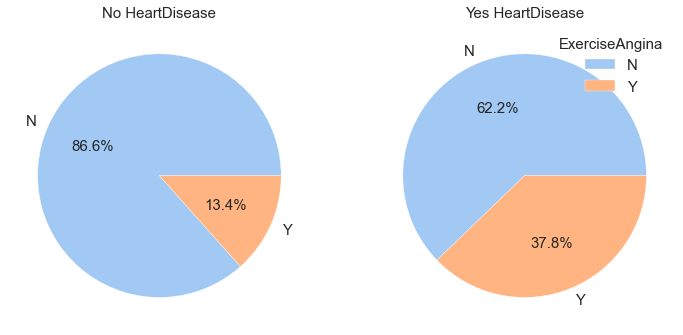

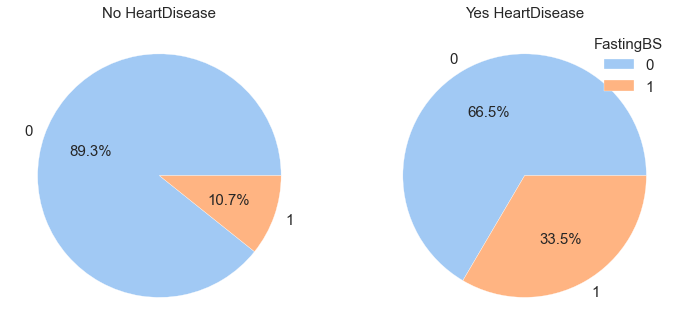

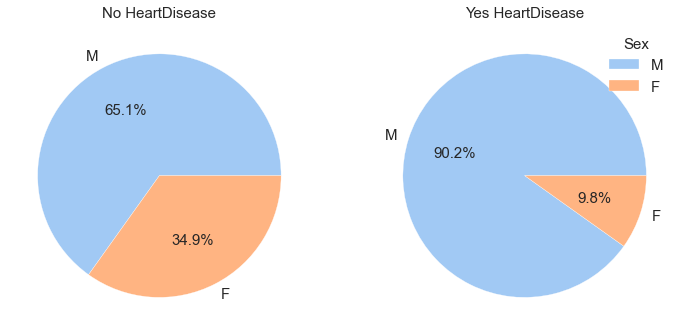

In [292]:
binary_feature = ["ExerciseAngina", "FastingBS", "Sex"]
for feature in binary_feature:
    pie_charts(df,feature,"HeartDisease")

In [293]:
df[df['HeartDisease']==0].describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu')

,count,mean,std,min,25%,50%,75%,max
Age,410.000000,50.551220,9.444915,28.000000,43.000000,51.000000,57.000000,76.000000
RestingBP,410.000000,130.180488,16.499585,80.000000,120.000000,130.000000,140.000000,190.000000
Cholesterol,410.000000,227.121951,74.634659,0.000000,197.250000,227.000000,266.750000,564.000000
MaxHR,410.000000,148.151220,23.288067,69.000000,134.000000,150.000000,165.000000,202.000000
Oldpeak,410.000000,0.408049,0.699709,-1.100000,0.000000,0.000000,0.600000,4.200000


In [294]:
df[df['HeartDisease']==1].describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu')

,count,mean,std,min,25%,50%,75%,max
Age,508.000000,55.899606,8.727056,31.000000,51.000000,57.000000,62.000000,77.000000
RestingBP,508.000000,134.185039,19.828685,0.000000,120.000000,132.000000,145.000000,200.000000
Cholesterol,508.000000,175.940945,126.391398,0.000000,0.000000,217.000000,267.000000,603.000000
MaxHR,508.000000,127.655512,23.386923,60.000000,112.000000,126.000000,144.250000,195.000000
Oldpeak,508.000000,1.274213,1.151872,-2.600000,0.000000,1.200000,2.000000,6.200000


# <font color="white" size=+1.5><b>3.2.b - Examination of multiclass features</b></font>


[Text(0, 0, 'No'), Text(1, 0, 'Yes')]

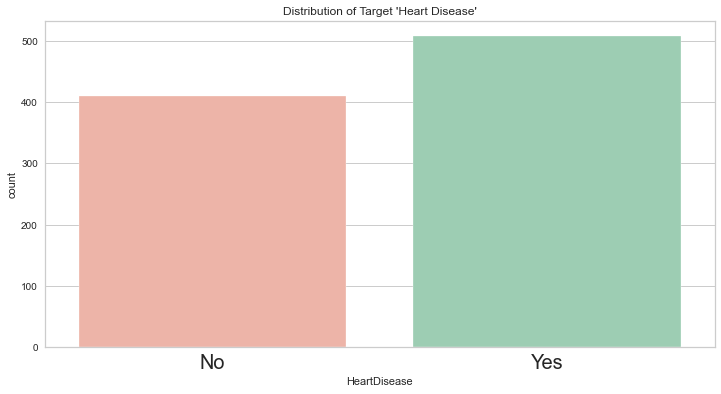

In [295]:
plt.figure(figsize=(12, 6))
heartDisease_countplot = sns.countplot(x=df.HeartDisease,palette=["#f8ad9d","#95d5b2"])
heartDisease_countplot.set_title("Distribution of Target 'Heart Disease'")
heartDisease_countplot.set_xticklabels(['No', 'Yes'], fontsize=20)

In [296]:
def distribution_categorical_features(data, feature, target, colors) :
    sns.set(rc={'figure.figsize':(14,6)},font_scale=1.2)
    grouped_columns = sns.countplot(x=feature, hue=target, data=data,palette=colors)
    grouped_columns.set_title('Countplot for {} {}'.format(target, feature))

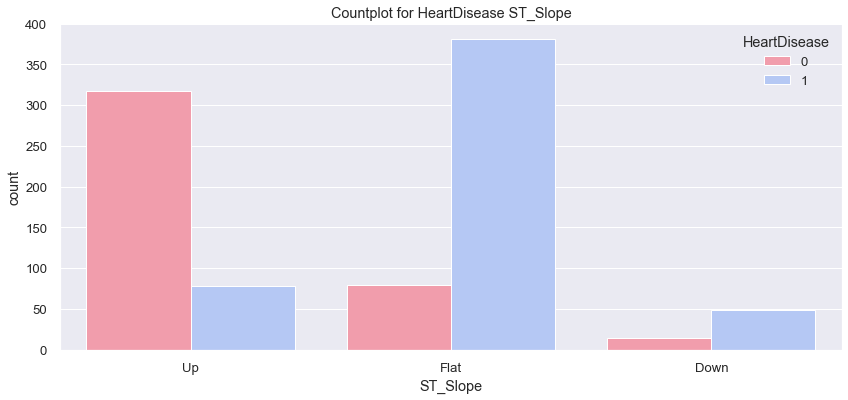

In [297]:
distribution_categorical_features(df, "ST_Slope", "HeartDisease", ["#ff8fa3","#abc4ff"])

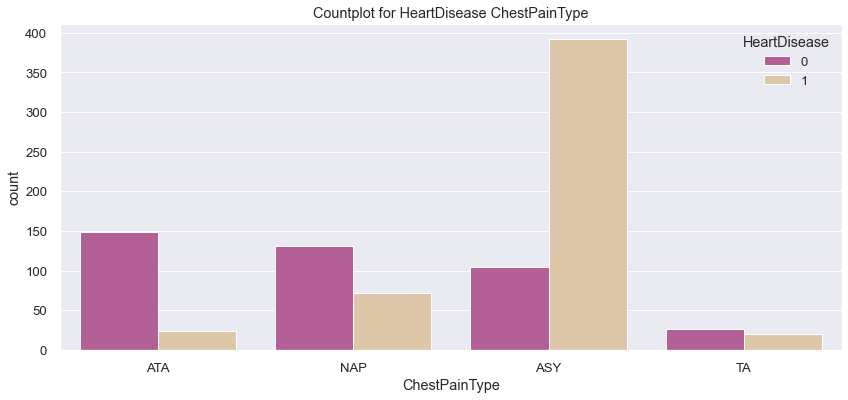

In [298]:
distribution_categorical_features(df, "ChestPainType", "HeartDisease", ["#c05299","#e7c8a0"])

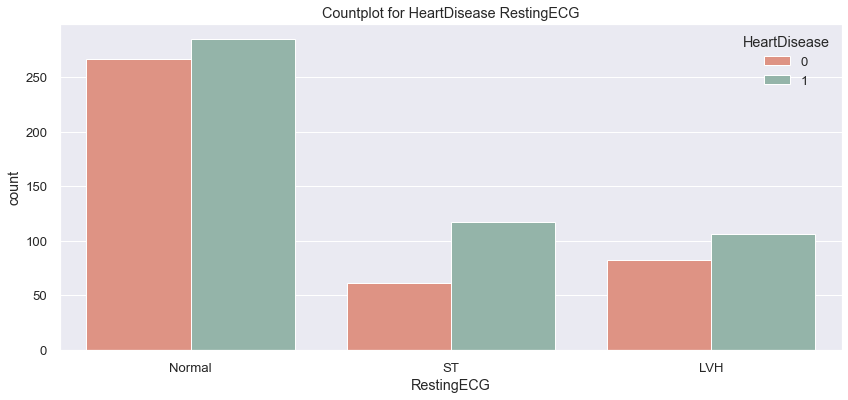

In [299]:
distribution_categorical_features(df, "RestingECG", "HeartDisease", ["#ED8975","#8FB9AA"])

# <font color="white" size=+1.5><b>3.2.c - Examination of numerical features</b></font>


In [300]:
def kde_numerical_features(df,column, target) : 
    fig, ax = plt.subplots(figsize = (13,5))
    sns.kdeplot(df[df[target]==1][column], alpha=0.5,shade = True, color="red", label="HeartDisease", ax = ax)
    sns.kdeplot(df[df[target]==0][column], alpha=0.5,shade = True, color="#fccc79", label="NoHeartDisease ", ax = ax)
    plt.title('KDE-Plot of {}'.format(column), fontsize = 18)
    ax.set_xlabel(column)
    ax.set_ylabel("Frequency")
    ax.legend()
    plt.show()

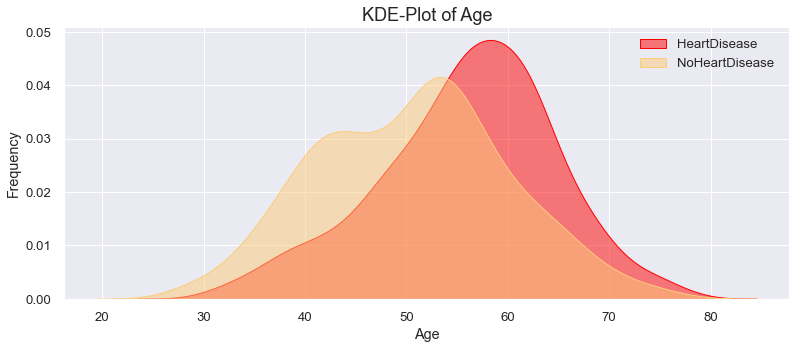

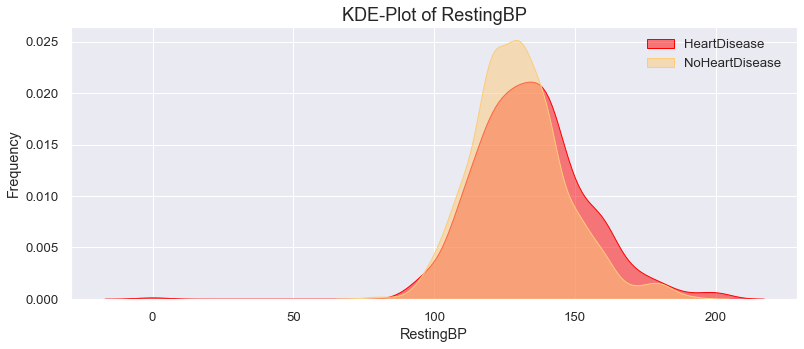

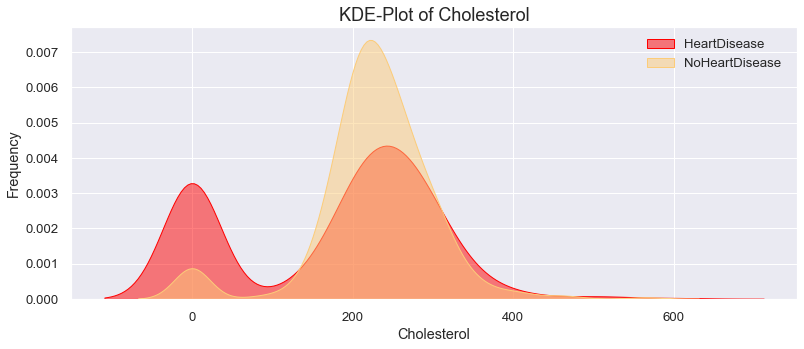

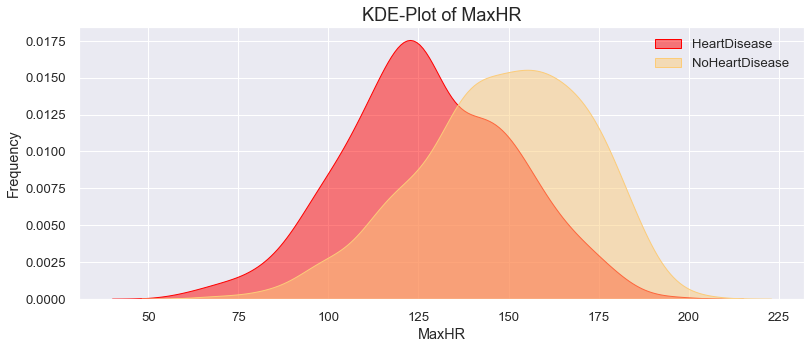

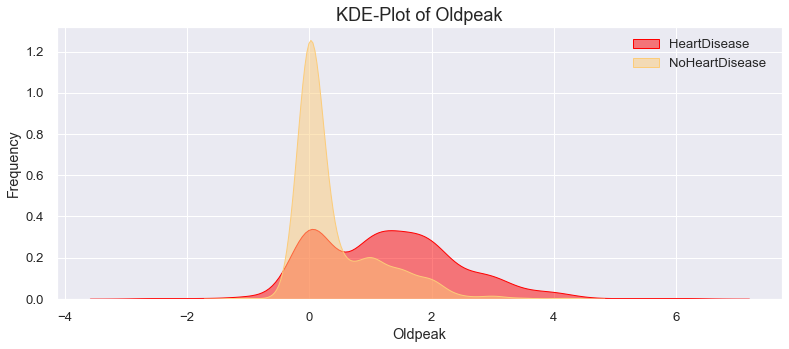

In [301]:
for column in numerical_columns : 
    kde_numerical_features(df,column, 'HeartDisease')

**Spliting Dataset into numeric & categoric features**

In [302]:
numerical= df.drop(['HeartDisease'], axis=1).select_dtypes('number').columns

categorical = df.select_dtypes('object').columns

print(f'Numerical Columns:  {df[numerical].columns}')
print('\n')
print(f'Categorical Columns: {df[categorical].columns}')

Numerical Columns:  Index(['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak'], dtype='object')


Categorical Columns: Index(['Sex', 'ChestPainType', 'RestingECG', 'ExerciseAngina', 'ST_Slope'], dtype='object')


In [303]:
df[numerical].describe().T.style.background_gradient(subset=['mean','std','50%','count'], cmap='RdPu')

,count,mean,std,min,25%,50%,75%,max
Age,918.000000,53.510893,9.432617,28.000000,47.000000,54.000000,60.000000,77.000000
RestingBP,918.000000,132.396514,18.514154,0.000000,120.000000,130.000000,140.000000,200.000000
Cholesterol,918.000000,198.799564,109.384145,0.000000,173.250000,223.000000,267.000000,603.000000
MaxHR,918.000000,136.809368,25.460334,60.000000,120.000000,138.000000,156.000000,202.000000
Oldpeak,918.000000,0.887364,1.066570,-2.600000,0.000000,0.600000,1.500000,6.200000


In [304]:
df[numerical].iplot(kind='hist');

In [305]:
df[numerical].iplot(kind='histogram', subplots=True,bins=50)

In [306]:
for i in numerical:
    df[i].iplot(kind="box", title=i, boxpoints="all", color='white')

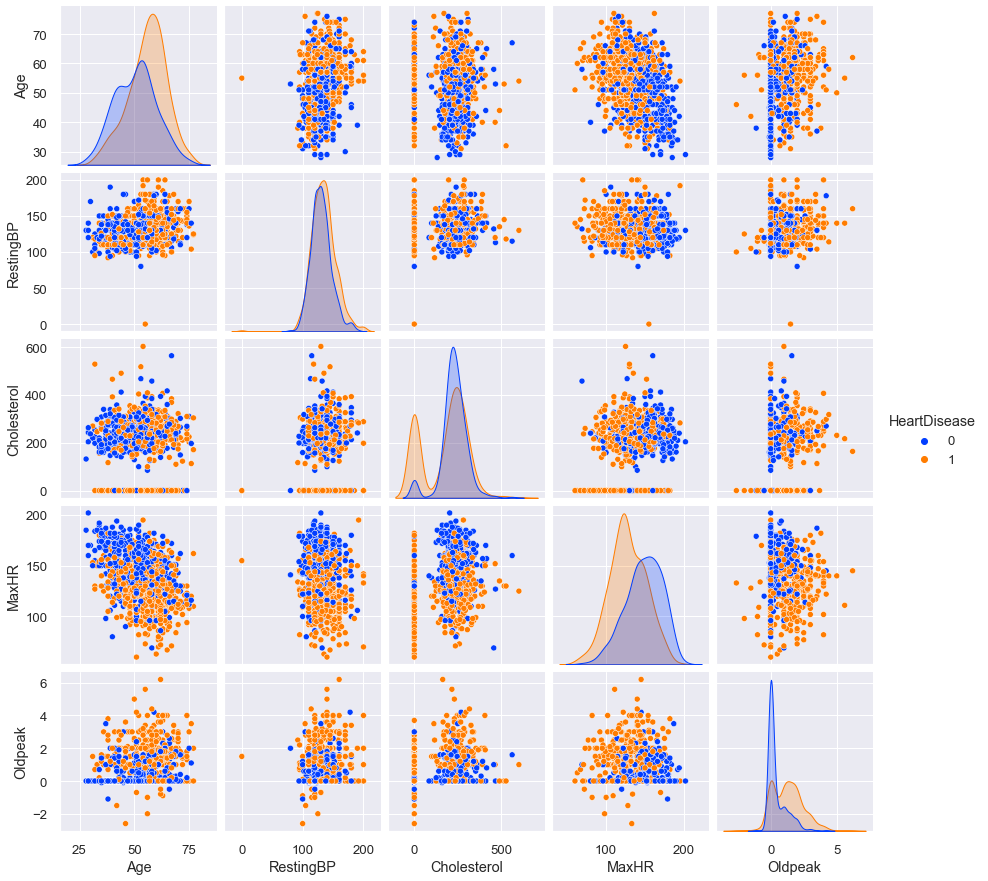

In [307]:
sns.pairplot(df, hue="HeartDisease", palette="bright")

# <font color="white" size=+1.5><b>3.3 - Examination of Skewness</b></font>


In [308]:
skew_vals = df.skew().sort_values(ascending=False)
skew_vals

Oldpeak        1.023
RestingBP      0.180
MaxHR         -0.144
Age           -0.196
Cholesterol   -0.610
dtype: float64

In [309]:
skew_limit = 0.5 # This is our threshold-limit to evaluate skewness. Overall below abs(1) seems acceptable for the linear models. 
skew_vals = df.skew()
skew_cols = skew_vals[abs(skew_vals)> skew_limit].sort_values(ascending=False)
skew_cols 

Oldpeak        1.023
Cholesterol   -0.610
dtype: float64

In [310]:
#Interpreting Skewness 

for skew in skew_vals:
    if -0.5 < skew < 0.5:
        print ("A skewness value of", '\033[1m', Fore.GREEN, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.GREEN, "symmetric", '\033[0m')
    elif  -0.5 < skew < -1.0 or 0.5 < skew < 1.0:
        print ("A skewness value of", '\033[1m', Fore.YELLOW, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.YELLOW, "moderately skewed", '\033[0m')
    else:
        print ("A skewness value of", '\033[1m', Fore.RED, skew, '\033[0m', "means that the distribution is approx.", '\033[1m', Fore.RED, "highly skewed", '\033[0m')

A skewness value of   -0.19593302867569365  means that the distribution is approx.   symmetric 
A skewness value of   0.1798393100516288  means that the distribution is approx.   symmetric 
A skewness value of   -0.6100864307268192  means that the distribution is approx.   highly skewed 
A skewness value of   -0.14435941846180994  means that the distribution is approx.   symmetric 
A skewness value of   1.0228720218107528  means that the distribution is approx.   highly skewed 


For preventing data leakage, we need to handle with kurtosis and skewness issue after splitting our data into train and test sets.

**For this purpose, we will use pipeline() since The pipeline can be used as any other estimator and avoids leaking the test set into the train set**

For a better understanding and more information, please refer to [external link text](https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html) & [external link text](https://machinelearningmastery.com/power-transforms-with-scikit-learn/)

Before deeping into the analysis it would be benefical to examine the correlation among variables using heatmap.

(array([0.5, 1.5, 2.5, 3.5, 4.5]),
 [Text(0.5, 0, 'Age'),
  Text(1.5, 0, 'RestingBP'),
  Text(2.5, 0, 'Cholesterol'),
  Text(3.5, 0, 'MaxHR'),
  Text(4.5, 0, 'Oldpeak')])

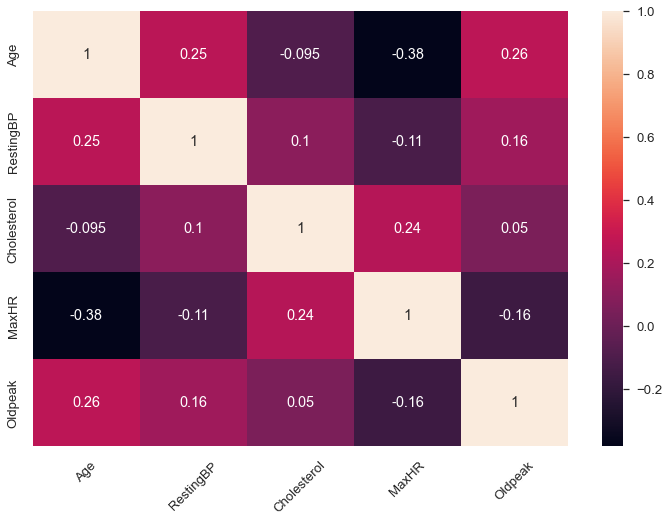

In [311]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True)
plt.xticks(rotation=45)

# <font color="white" size=+1.5><b>3.4 - Outlier detection of Categorical Features</b></font>


In [312]:
df[categorical].head().T

,0,1,2,3,4
Sex,M,F,M,F,M
ChestPainType,ATA,NAP,ATA,ASY,NAP
RestingECG,Normal,Normal,ST,Normal,Normal
ExerciseAngina,N,N,N,Y,N
ST_Slope,Up,Flat,Up,Flat,Up


In [313]:
df[categorical].describe()

,Sex,ChestPainType,RestingECG,ExerciseAngina,ST_Slope
count,918,918,918,918,918
unique,2,4,3,2,3
top,M,ASY,Normal,N,Flat
freq,725,496,552,547,460


In [314]:
for i in categorical:
    df[i].iplot(kind="box", title=i, boxpoints="all", color='white')

# <font color="white" size=+1.5><b>3.5 - Creating dummy variables</b></font>



In [315]:
df.shape

(918, 12)

In [316]:
df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.000,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.000,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.000,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.500,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.000,Up,0


In [317]:
df[categorical].value_counts()

Sex  ChestPainType  RestingECG  ExerciseAngina  ST_Slope
M    ASY            Normal      Y               Flat        109
     ATA            Normal      N               Up           64
     ASY            Normal      N               Flat         55
                    ST          Y               Flat         49
     NAP            Normal      N               Up           46
                                                           ... 
F    NAP            ST          Y               Flat          1
     TA             LVH         N               Up            1
                    Normal      N               Down          1
M    ATA            LVH         Y               Flat          1
     TA             ST          Y               Flat          1
Length: 95, dtype: int64

In [318]:
df = pd.get_dummies(df, drop_first=True)

In [319]:
df.shape

(918, 16)

In [320]:
df.head()

,Age,RestingBP,Cholesterol,MaxHR,Oldpeak,Sex_M,ChestPainType_ATA,ChestPainType_NAP,ChestPainType_TA,FastingBS_1,RestingECG_Normal,RestingECG_ST,ExerciseAngina_Y,ST_Slope_Flat,ST_Slope_Up,HeartDisease_1
0,40,140,289,172,0.000,1,1,0,0,0,1,0,0,0,1,0
1,49,160,180,156,1.000,0,0,1,0,0,1,0,0,1,0,1
2,37,130,283,98,0.000,1,1,0,0,0,0,1,0,0,1,0
3,48,138,214,108,1.500,0,0,0,0,0,1,0,1,1,0,1
4,54,150,195,122,0.000,1,0,1,0,0,1,0,0,0,1,0


# <font color="white" size=+3.5><b>4) TRAIN TEST SPLIT & HANDLING WITH MISSING VALUES</b></font>


# <font color="white" size=+1.5><b>4.1 Train | Test Split</b></font>


In [321]:
X = df.drop(["HeartDisease_1","Cholesterol"], axis=1)
y = df["HeartDisease_1"]

In [322]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, stratify = y, random_state = 101)

# <font color="white" size=+1.5><b>4.2 Looking for Missing Values</b></font>


In [323]:
missing(df)

,Missing_Number,Missing_Percent
Age,0,0.000
RestingBP,0,0.000
Cholesterol,0,0.000
MaxHR,0,0.000
Oldpeak,0,0.000
Sex_M,0,0.000
ChestPainType_ATA,0,0.000
ChestPainType_NAP,0,0.000
ChestPainType_TA,0,0.000
FastingBS_1,0,0.000


**Since there have been no missing values so there is no need to handle with them.**


# <font color="white" size=+3.5><b>5) FEATURE SCALING</b></font>


# <font color="white" size=+1.5><b>5.1 Implementation</b></font>


In [324]:
scaler = MinMaxScaler()
scaler

MinMaxScaler()

In [325]:
X_train_scaled = scaler.fit_transform(X_train)

In [326]:
X_test_scaled = scaler.transform(X_test)

# <font color="white" size=+1.5><b>5.2 Helper functions for insights</b></font>


In [327]:
# General Insights

def model_first_insight(X_train, y_train, class_weight, solver='liblinear'):
    # Logistic Regression
    log = LogisticRegression(random_state=101, class_weight=class_weight)
    log.fit(X_train, y_train)
    
    # Decision Tree
    decision_tree = DecisionTreeClassifier(criterion = 'entropy', random_state=101, class_weight=class_weight)
    decision_tree.fit(X_train, y_train)
   
    # Random Forest
    random_forest = RandomForestClassifier(n_estimators=10, criterion = 'entropy', random_state=101, class_weight=class_weight)
    random_forest.fit(X_train, y_train)
    
    # KNN
    knn = KNeighborsClassifier(n_neighbors = 3)
    knn.fit(X_train, y_train) 
   
    # SVC
    svc = SVC(random_state=101, class_weight=class_weight)
    svc.fit(X_train, y_train) 
    
    # XGB
    xgb = XGBClassifier(random_state=101, class_weight=class_weight)
    xgb.fit(X_train, y_train)
    
    #MLP
    mlp=MLPClassifier()
    mlp.fit(X_train, y_train)

    
    return log, svc, decision_tree, random_forest, knn, mlp, xgb

In [328]:
def models(X_train, y_train, class_weight):
    
    # Logistic Regression
    log = LogisticRegression(random_state=101, class_weight=class_weight, solver='liblinear')
    log.fit(X_train, y_train)
    
    # Decision Tree
    decision_tree = DecisionTreeClassifier(criterion = 'entropy', random_state=101, class_weight=class_weight)
    decision_tree.fit(X_train, y_train)
    
    # Random Forest
    random_forest = RandomForestClassifier(n_estimators=10, criterion = 'entropy', random_state=101, class_weight=class_weight)
    random_forest.fit(X_train, y_train)
    # KNN
    knn = KNeighborsClassifier(n_neighbors = 3)
    knn.fit(X_train, y_train) 
   
    # SVC
    svc = SVC(random_state=101, class_weight=class_weight)
    svc.fit(X_train, y_train) 
    
    # XGB
    xgb = XGBClassifier(random_state=101, class_weight=class_weight)
    xgb.fit(X_train, y_train)
    
    mlp=MLPClassifier()
    mlp.fit(X_train, y_train)

  
    return log.score(X_train, y_train), svc.score(X_train, y_train),decision_tree.score(X_train, y_train),random_forest.score(X_train, y_train),knn.score(X_train, y_train),mlp.score(X_train, y_train),xgb.score(X_train, y_train)

In [329]:
def models_accuracy(X_Set, y_Set):    
    Scores = pd.DataFrame(columns = ["LR_Acc", "SVC_Acc", "DT_Acc", "RF_Acc", "KNN_Acc", "MLP_Acc", "XGB_Acc"])


    Basic = [log_acc, svc_acc, decision_tree_acc, random_forest_acc, knn_acc, mlp_acc, xgb_acc] = models(X_train, y_train, None)
    Scores.loc[0] = Basic

    Scaled = [log_acc, svc_acc, decision_tree_acc, random_forest_acc, knn_acc, mlp_acc, xgb_acc] = models(X_train_scaled, y_train, None)
    Scores.loc[1] = Scaled
 
    Balanced = [log_acc, svc_acc, decision_tree_acc, random_forest_acc, knn_acc, mlp_acc, xgb_acc] = models(X_train, y_train, "balanced")
    Scores.loc[2] = Balanced

    
    Scaled_Balanced = [log_acc, svc_acc, decision_tree_acc, random_forest_acc, knn_acc, mlp_acc, xgb_acc] = models(X_train_scaled, y_train, "balanced")
    Scores.loc[3] = Scaled_Balanced

    Scores.set_axis(['Basic', 'Scaled', 'Balanced', 'Scaled_Balanced'], axis='index', inplace=True)

    return Scores

In [330]:
accuracy_scores=models_accuracy(X_train, y_train)
accuracy_scores

[19:46:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "class_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[19:46:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.6.0/src/learner.cc:627: 
Parameters: { "class_weight" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




,LR_Acc,SVC_Acc,DT_Acc,RF_Acc,KNN_Acc,MLP_Acc,XGB_Acc
Basic,0.863,0.695,1.000,0.988,0.826,0.873,1.000
Scaled,0.864,0.879,1.000,0.988,0.900,0.885,1.000
Balanced,0.855,0.699,1.000,0.988,0.826,0.864,1.000
Scaled_Balanced,0.856,0.882,1.000,0.988,0.900,0.879,1.000


In [331]:
def plot_cv(cv_lis):
    hi=cv_lis['test_accuracy']
    cvr=range(1,11)
    plt.plot(cvr,hi,'-o')
    plt.xlabel('CV')
    plt.ylabel('Accuracy')
    plt.show()

# <font color="white" size=+3.5><b>6) MODELLING & MODEL PERFORMANCE</b></font>


# <font color="white" size=+1.5><b>6.1 Logistic Regression (LR)</b></font>


In [332]:
accuracy_scores

,LR_Acc,SVC_Acc,DT_Acc,RF_Acc,KNN_Acc,MLP_Acc,XGB_Acc
Basic,0.863,0.695,1.000,0.988,0.826,0.873,1.000
Scaled,0.864,0.879,1.000,0.988,0.900,0.885,1.000
Balanced,0.855,0.699,1.000,0.988,0.826,0.864,1.000
Scaled_Balanced,0.856,0.882,1.000,0.988,0.900,0.879,1.000


# <font color="white" size=+0.5><b>6.1.a Modelling Logistic Regression (LR) with Default Parameters</b></font>


--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.82      0.87        62
           1       0.87      0.95      0.91        76

    accuracy                           0.89       138
   macro avg       0.90      0.88      0.89       138
weighted avg       0.89      0.89      0.89       138

--------------------------------------------------------


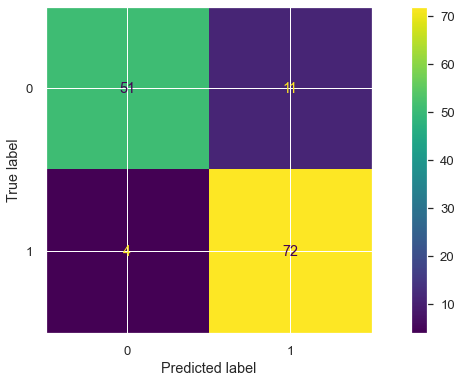

In [333]:
LR_model = LogisticRegression() # Since Basic accuracy outcome gives the best model accuracy results, we will implement it 
LR_model.fit(X_train_scaled, y_train)
y_pred = LR_model.predict(X_test_scaled)
y_train_pred = LR_model.predict(X_train_scaled)

log_f1 = f1_score(y_test, y_pred)
log_acc = accuracy_score(y_test, y_pred)
log_recall = recall_score(y_test, y_pred)
log_auc = roc_auc_score(y_test, y_pred)


print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(LR_model, X_test_scaled, y_test)

# train_val(y_train, y_train_pred, y_test, y_pred)

In [334]:
y_pred_proba = LR_model.predict_proba(X_test_scaled)
y_pred_proba

array([[0.04056209, 0.95943791],
       [0.05308458, 0.94691542],
       [0.23609874, 0.76390126],
       [0.91290154, 0.08709846],
       [0.65222721, 0.34777279],
       [0.15944173, 0.84055827],
       [0.21324797, 0.78675203],
       [0.4322931 , 0.5677069 ],
       [0.49339359, 0.50660641],
       [0.80594905, 0.19405095],
       [0.02409542, 0.97590458],
       [0.08109087, 0.91890913],
       [0.09901864, 0.90098136],
       [0.94958427, 0.05041573],
       [0.18075496, 0.81924504],
       [0.07142492, 0.92857508],
       [0.05330708, 0.94669292],
       [0.09174421, 0.90825579],
       [0.28907175, 0.71092825],
       [0.47245856, 0.52754144],
       [0.91731451, 0.08268549],
       [0.01952844, 0.98047156],
       [0.06608588, 0.93391412],
       [0.93780009, 0.06219991],
       [0.26509647, 0.73490353],
       [0.97125359, 0.02874641],
       [0.19969886, 0.80030114],
       [0.37752215, 0.62247785],
       [0.33219308, 0.66780692],
       [0.97535885, 0.02464115],
       [0.

# <font color="white" size=+0.5><b>6.1.b Cross-Validating Logistic Regression (LR) Model</b></font>


In [335]:
log_xvalid_model = LogisticRegression()

log_xvalid_model_scores = cross_validate(log_xvalid_model, X_train_scaled, y_train, scoring = ['accuracy', 'precision','recall',
                                                                          'f1'], cv = 10)
log_xvalid_model_scores = pd.DataFrame(log_xvalid_model_scores, index = range(1, 11))

log_xvalid_model_scores

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1
1,0.010,0.004,0.808,0.792,0.884,0.835
2,0.008,0.003,0.808,0.818,0.837,0.828
3,0.007,0.003,0.872,0.884,0.884,0.884
4,0.007,0.003,0.846,0.878,0.837,0.857
5,0.008,0.003,0.910,0.909,0.930,0.920
6,0.010,0.003,0.821,0.837,0.837,0.837
7,0.010,0.003,0.872,0.851,0.930,0.889
8,0.009,0.003,0.859,0.833,0.930,0.879
9,0.010,0.003,0.833,0.897,0.795,0.843
10,0.010,0.002,0.923,0.913,0.955,0.933


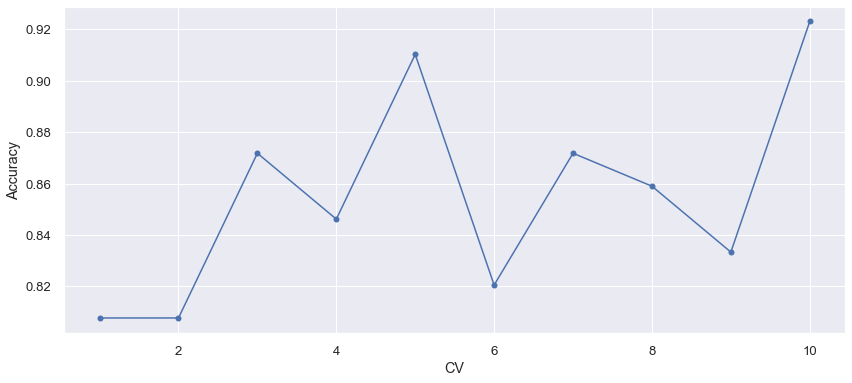

In [336]:
plot_cv(log_xvalid_model_scores)

# <font color="white" size=+0.5><b>6.1.c Hyperparameter tuning Using GridSeachCV</b></font>


In [337]:
penalty = ["l1", "l2", "elasticnet"]
l1_ratio = np.linspace(0, 1, 20)
C = np.logspace(0, 10, 20)

param_grid = {"penalty" : penalty,"l1_ratio" : l1_ratio,"C" : C}

In [338]:
LR_grid_model = LogisticRegression(solver='saga', max_iter=5000, class_weight = "balanced")

LR_grid_model = GridSearchCV(LR_grid_model, param_grid = param_grid)

In [339]:
LR_grid_model.fit(X_train_scaled, y_train)

GridSearchCV(estimator=LogisticRegression(class_weight='balanced',
                                          max_iter=5000, solver='saga'),
             param_grid={'C': array([1.00000000e+00, 3.35981829e+00, 1.12883789e+01, 3.79269019e+01,
       1.27427499e+02, 4.28133240e+02, 1.43844989e+03, 4.83293024e+03,
       1.62377674e+04, 5.45559478e+04, 1.83298071e+05, 6.15848211e+05,
       2.06913808e+06, 6.95192796e+06, 2.33572147e+07, 7.84759970e+07,
       2.63665090e+08, 8.85866790e+08, 2.97635144e+09, 1.00000000e+10]),
                         'l1_ratio': array([0.        , 0.05263158, 0.10526316, 0.15789474, 0.21052632,
       0.26315789, 0.31578947, 0.36842105, 0.42105263, 0.47368421,
       0.52631579, 0.57894737, 0.63157895, 0.68421053, 0.73684211,
       0.78947368, 0.84210526, 0.89473684, 0.94736842, 1.        ]),
                         'penalty': ['l1', 'l2', 'elasticnet']})

In [340]:
print('Best Parameters of GridSearchCV for LR Model:', LR_grid_model.best_params_)
print("--------------------------------------------------------------------------------------------------------------------")
print('Best Estimator of GridSearchCV for LR Model:', LR_grid_model.best_estimator_)

Best Parameters of GridSearchCV for LR Model: {'C': 1.0, 'l1_ratio': 0.05263157894736842, 'penalty': 'elasticnet'}
--------------------------------------------------------------------------------------------------------------------
Best Estimator of GridSearchCV for LR Model: LogisticRegression(class_weight='balanced', l1_ratio=0.05263157894736842,
                   max_iter=5000, penalty='elasticnet', solver='saga')


[[52 10]
 [ 9 67]]
--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.85      0.84      0.85        62
           1       0.87      0.88      0.88        76

    accuracy                           0.86       138
   macro avg       0.86      0.86      0.86       138
weighted avg       0.86      0.86      0.86       138

--------------------------------------------------------


,train_set,test_set
Accuracy,0.859,0.862
Precision,0.878,0.870
Recall,0.866,0.882
f1,0.872,0.876


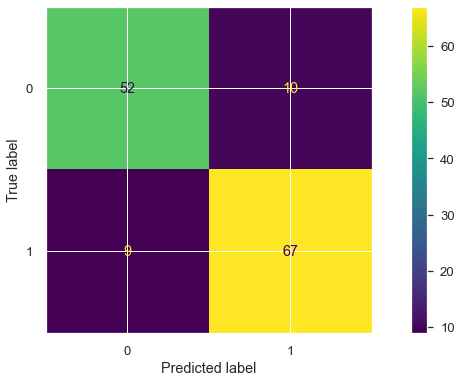

In [341]:
y_pred = LR_grid_model.predict(X_test_scaled)
y_train_pred = LR_grid_model.predict(X_train_scaled)

log_grid_f1 = f1_score(y_test, y_pred)
log_grid_acc = accuracy_score(y_test, y_pred)
log_grid_recall = recall_score(y_test, y_pred)
log_grid_auc = roc_auc_score(y_test, y_pred)

print(confusion_matrix(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(LR_grid_model, X_test_scaled, y_test)

train_val(y_train, y_train_pred, y_test, y_pred)

# <font color="white" size=+0.5><b>6.1.d ROC (Receiver Operating Curve) and AUC (Area Under Curve)</b></font>


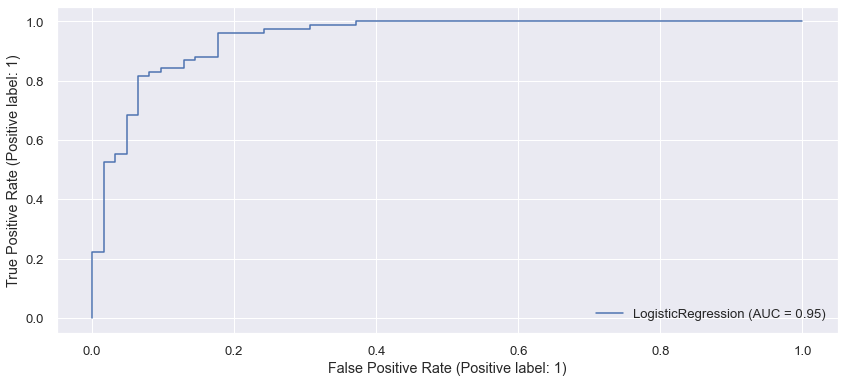

In [342]:
plot_roc_curve(LR_model, X_test_scaled, y_test, response_method='auto');

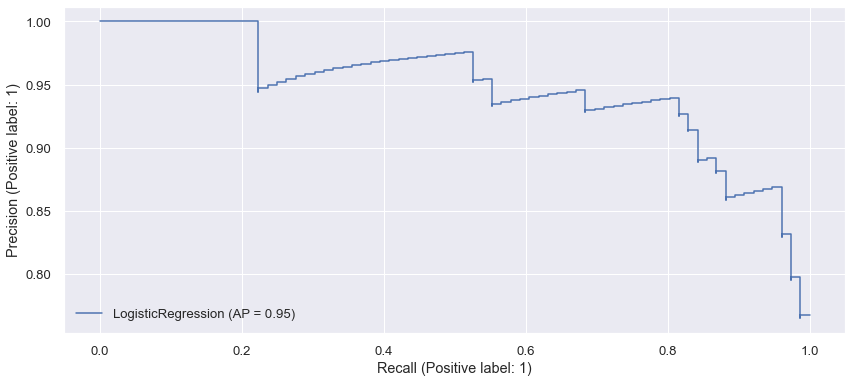

In [343]:
plot_precision_recall_curve(LR_model, X_test_scaled, y_test);

# <font color="white" size=+1.5><b>6.2 Support Vector Machine (SVM)</b></font>


In [344]:
accuracy_scores

,LR_Acc,SVC_Acc,DT_Acc,RF_Acc,KNN_Acc,MLP_Acc,XGB_Acc
Basic,0.863,0.695,1.000,0.988,0.826,0.873,1.000
Scaled,0.864,0.879,1.000,0.988,0.900,0.885,1.000
Balanced,0.855,0.699,1.000,0.988,0.826,0.864,1.000
Scaled_Balanced,0.856,0.882,1.000,0.988,0.900,0.879,1.000


# <font color="white" size=+0.5><b>6.2.a Modelling Support Vector Machine (SVM) with Default Parameters</b></font>


--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.84      0.85        62
           1       0.87      0.89      0.88        76

    accuracy                           0.87       138
   macro avg       0.87      0.87      0.87       138
weighted avg       0.87      0.87      0.87       138

--------------------------------------------------------


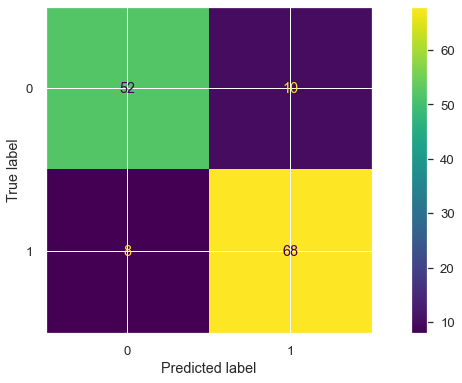

In [345]:
SVM_model = SVC(random_state=42)
SVM_model.fit(X_train_scaled, y_train)
y_pred = SVM_model.predict(X_test_scaled)
y_train_pred = SVM_model.predict(X_train_scaled)

svm_f1 = f1_score(y_test, y_pred)
svm_acc = accuracy_score(y_test, y_pred)
svm_recall = recall_score(y_test, y_pred)
svm_auc = roc_auc_score(y_test, y_pred)

print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(SVM_model, X_test_scaled, y_test)


# <font color="white" size=+0.5><b>6.2.b Cross-Validating Support Vector Machine (SVM) Model</b></font>


In [346]:
svm_xvalid_model = SVC()

svm_xvalid_model_scores = cross_validate(svm_xvalid_model, X_train_scaled, y_train, scoring = ['accuracy', 'precision','recall',
                                                                   'f1'], cv = 10)
svm_xvalid_model_scores = pd.DataFrame(svm_xvalid_model_scores, index = range(1, 11))

svm_xvalid_model_scores

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1
1,0.015,0.006,0.833,0.800,0.930,0.860
2,0.015,0.006,0.821,0.796,0.907,0.848
3,0.014,0.006,0.859,0.881,0.860,0.871
4,0.014,0.006,0.821,0.837,0.837,0.837
5,0.015,0.006,0.936,0.952,0.930,0.941
6,0.015,0.006,0.782,0.795,0.814,0.805
7,0.015,0.006,0.885,0.854,0.953,0.901
8,0.015,0.006,0.859,0.848,0.907,0.876
9,0.016,0.006,0.833,0.897,0.795,0.843
10,0.015,0.006,0.910,0.911,0.932,0.921


In [347]:
svm_xvalid_model_scores.mean()[2:]

test_accuracy    0.854
test_precision   0.857
test_recall      0.887
test_f1          0.870
dtype: float64

# <font color="white" size=+0.5><b>6.2.c Hyperparameter tuning Support Vector Machine (SVM) Using GridSeachCV</b></font>


In [348]:
param_grid = {'C': [0.1,1, 10, 100, 1000],
              'gamma': ["scale", "auto", 1,0.1,0.01,0.001,0.0001],
              'kernel': ['rbf', 'linear']}

In [349]:
SVM_grid_model = SVC(random_state=42)

SVM_grid_model = GridSearchCV(SVM_grid_model, param_grid, refit=True)

In [350]:
SVM_grid_model.fit(X_train_scaled, y_train)

GridSearchCV(estimator=SVC(random_state=42),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': ['scale', 'auto', 1, 0.1, 0.01, 0.001,
                                   0.0001],
                         'kernel': ['rbf', 'linear']})

In [351]:
print('Best Parameters of GridSearchCV for SVM Model:',SVM_grid_model.best_params_ )
print("--------------------------------------------------------------------------------------------------------------------")
print('Best Estimator of GridSearchCV for SVM Model:',SVM_grid_model.best_estimator_)

Best Parameters of GridSearchCV for SVM Model: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
--------------------------------------------------------------------------------------------------------------------
Best Estimator of GridSearchCV for SVM Model: SVC(C=10, gamma=0.01, random_state=42)


--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.90      0.85      0.88        62
           1       0.89      0.92      0.90        76

    accuracy                           0.89       138
   macro avg       0.89      0.89      0.89       138
weighted avg       0.89      0.89      0.89       138

--------------------------------------------------------


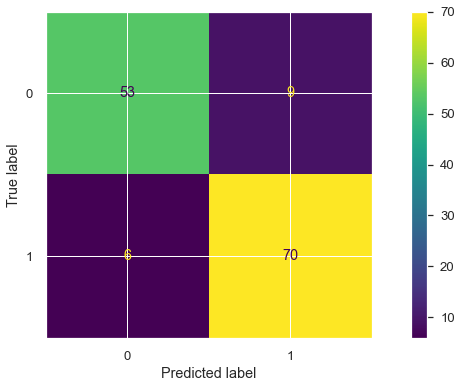

In [352]:
y_pred = SVM_grid_model.predict(X_test_scaled)
y_train_pred = SVM_grid_model.predict(X_train_scaled)

svm_grid_f1 = f1_score(y_test, y_pred)
svm_grid_acc = accuracy_score(y_test, y_pred)
svm_grid_recall = recall_score(y_test, y_pred)
svm_grid_auc = roc_auc_score(y_test, y_pred)


print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(SVM_grid_model, X_test_scaled, y_test)

# train_val(y_train, y_train_pred, y_test, y_pred)

# <font color="white" size=+0.5><b>6.2.d ROC (Receiver Operating Curve) and AUC (Area Under Curve)</b></font>


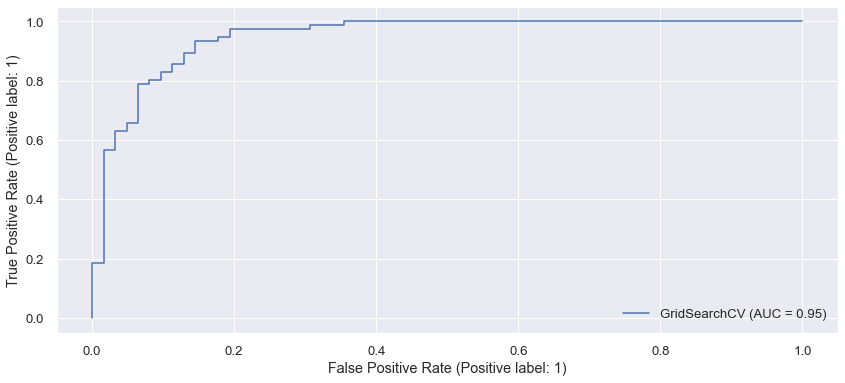

In [353]:
plot_roc_curve(SVM_grid_model, X_test_scaled, y_test)

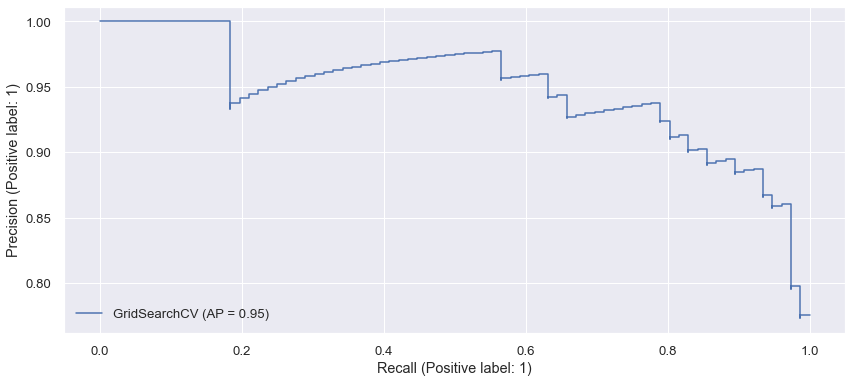

In [354]:
plot_precision_recall_curve(SVM_grid_model, X_test_scaled, y_test)

# <font color="white" size=+1.5><b>6.3 Decision Tree (DT)</b></font>


In [355]:
accuracy_scores

,LR_Acc,SVC_Acc,DT_Acc,RF_Acc,KNN_Acc,MLP_Acc,XGB_Acc
Basic,0.863,0.695,1.000,0.988,0.826,0.873,1.000
Scaled,0.864,0.879,1.000,0.988,0.900,0.885,1.000
Balanced,0.855,0.699,1.000,0.988,0.826,0.864,1.000
Scaled_Balanced,0.856,0.882,1.000,0.988,0.900,0.879,1.000


# <font color="white" size=+0.5><b>6.3.a Modelling Decision Tree (DT) with Default Parameters</b></font>


--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.79      0.73      0.76        62
           1       0.79      0.84      0.82        76

    accuracy                           0.79       138
   macro avg       0.79      0.78      0.79       138
weighted avg       0.79      0.79      0.79       138

--------------------------------------------------------


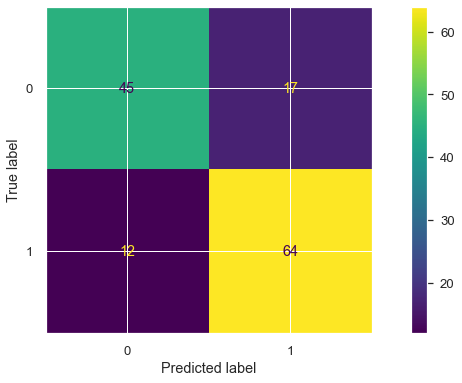

In [356]:
DT_model = DecisionTreeClassifier(class_weight="balanced", random_state=42)
DT_model.fit(X_train_scaled, y_train)
y_pred = DT_model.predict(X_test_scaled)
y_train_pred = DT_model.predict(X_train_scaled)

dt_f1 = f1_score(y_test, y_pred)
dt_acc = accuracy_score(y_test, y_pred)
dt_recall = recall_score(y_test, y_pred)
dt_auc = roc_auc_score(y_test, y_pred)

print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(DT_model, X_test_scaled, y_test)


# <font color="white" size=+0.5><b>6.3.b Cross-Validating Decision Tree (DT)</b></font>


In [357]:
dt_xvalid_model = DecisionTreeClassifier(max_depth=None, random_state=42)

dt_xvalid_model_scores = cross_validate(dt_xvalid_model, X_train_scaled, y_train, scoring = ["accuracy", "precision", "recall", "f1"], cv = 10)
dt_xvalid_model_scores = pd.DataFrame(dt_xvalid_model_scores, index = range(1, 11))

dt_xvalid_model_scores

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1
1,0.003,0.003,0.756,0.773,0.791,0.782
2,0.003,0.003,0.782,0.783,0.837,0.809
3,0.003,0.003,0.769,0.821,0.744,0.780
4,0.003,0.002,0.744,0.767,0.767,0.767
5,0.003,0.003,0.718,0.756,0.721,0.738
6,0.003,0.003,0.718,0.756,0.721,0.738
7,0.003,0.004,0.731,0.739,0.791,0.764
8,0.003,0.002,0.718,0.744,0.744,0.744
9,0.003,0.002,0.833,0.919,0.773,0.840
10,0.002,0.003,0.833,0.878,0.818,0.847


# <font color="white" size=+0.5><b>6.3.c Hyperparameter tuning Decision Tree (DT) Using GridSeachCV</b></font>


In [358]:
param_grid = {"splitter":["best", "random"],
              "max_features":[None, 3, 5, 7],
              "max_depth": [None, 4, 5, 6, 7, 8, 9, 10],
              "min_samples_leaf": [2, 3, 5],
              "min_samples_split": [2, 3, 5, 7, 9, 15]}

In [359]:
DT_grid_model = DecisionTreeClassifier(class_weight = "balanced", random_state=42)

DT_grid_model = GridSearchCV(estimator=DT_grid_model,
                            param_grid=param_grid,
                            scoring='recall',
                            n_jobs = -1, verbose = 2).fit(X_train_scaled, y_train)

Fitting 5 folds for each of 1152 candidates, totalling 5760 fits


**Let's look at the best parameters & estimator found by GridSearchCV.**

In [360]:
print('Best Parameters of GridSearchCV for Decision Tree Model:', DT_grid_model.best_params_)
print("--------------------------------------------------------------------------------------------------------------------")
print('Best Estimator of GridSearchCV for Decision Tree Model:',DT_grid_model.best_estimator_)

Best Parameters of GridSearchCV for Decision Tree Model: {'max_depth': 9, 'max_features': 3, 'min_samples_leaf': 3, 'min_samples_split': 15, 'splitter': 'random'}
--------------------------------------------------------------------------------------------------------------------
Best Estimator of GridSearchCV for Decision Tree Model: DecisionTreeClassifier(class_weight='balanced', max_depth=9, max_features=3,
                       min_samples_leaf=3, min_samples_split=15,
                       random_state=42, splitter='random')


Fitting 5 folds for each of 1152 candidates, totalling 5760 fits
--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.85      0.80        62
           1       0.87      0.78      0.82        76

    accuracy                           0.81       138
   macro avg       0.81      0.82      0.81       138
weighted avg       0.82      0.81      0.81       138

--------------------------------------------------------


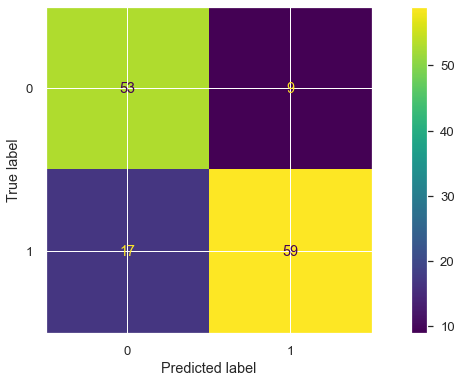

In [361]:
DT_grid_model.fit(X_train_scaled, y_train)
y_pred = DT_grid_model.predict(X_test_scaled)

y_train_pred = DT_grid_model.predict(X_train_scaled)

dt_grid_f1 = f1_score(y_test, y_pred)
dt_grid_acc = accuracy_score(y_test, y_pred)
dt_grid_recall = recall_score(y_test, y_pred)
dt_grid_auc = roc_auc_score(y_test, y_pred)


print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(DT_grid_model, X_test_scaled, y_test)



# <font color="white" size=+0.5><b>6.3.d Feature Importance for Decision Tree (DT) Model</b></font>


In [362]:
DT_model.feature_importances_

array([0.09044499, 0.10506451, 0.13791948, 0.09525642, 0.05604356,
       0.01891455, 0.02390515, 0.01099501, 0.02705443, 0.02407673,
       0.01087553, 0.02791577, 0.0025641 , 0.36896978])

In [363]:
DT_feature_imp = pd.DataFrame(index=X.columns, data = DT_model.feature_importances_, 
                      columns = ["Feature Importance"]).sort_values("Feature Importance")
DT_feature_imp

,Feature Importance
ST_Slope_Flat,0.003
RestingECG_ST,0.011
ChestPainType_TA,0.011
ChestPainType_ATA,0.019
ChestPainType_NAP,0.024
RestingECG_Normal,0.024
FastingBS_1,0.027
ExerciseAngina_Y,0.028
Sex_M,0.056
Age,0.090


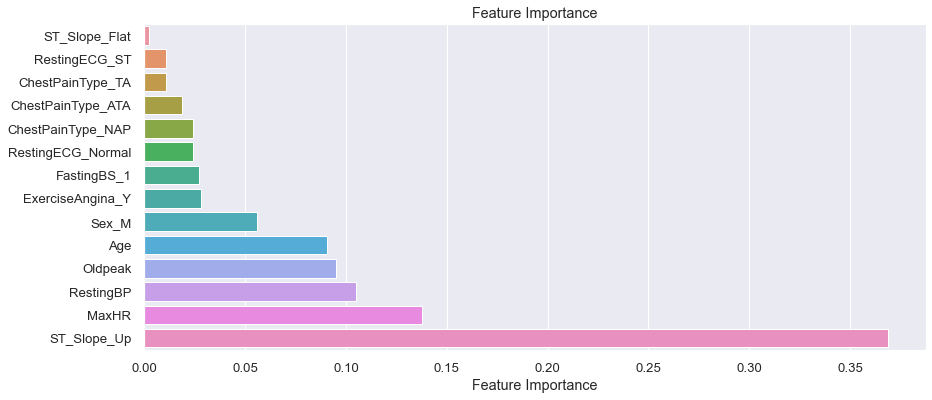

In [364]:
sns.barplot(x=DT_feature_imp["Feature Importance"], y=DT_feature_imp.index)
plt.title("Feature Importance")
plt.show()

# <font color="white" size=+0.5><b>6.3.e ROC (Receiver Operating Curve) and AUC (Area Under Curve)</b></font>


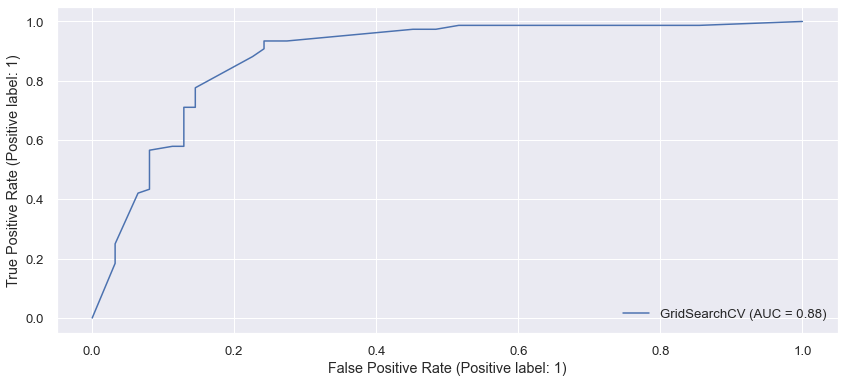

In [365]:
plot_roc_curve(DT_grid_model, X_test_scaled, y_test);

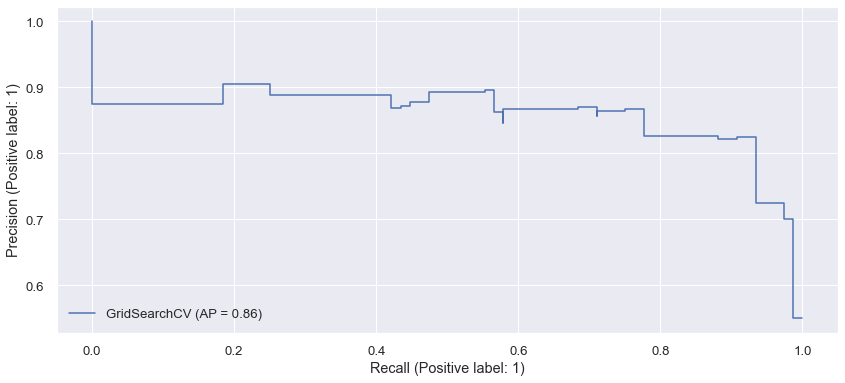

In [366]:
plot_precision_recall_curve(DT_grid_model, X_test_scaled, y_test);

# <font color="white" size=+1.5><b>6.4 Random Forest (RF)</b></font>


In [367]:
accuracy_scores

,LR_Acc,SVC_Acc,DT_Acc,RF_Acc,KNN_Acc,MLP_Acc,XGB_Acc
Basic,0.863,0.695,1.000,0.988,0.826,0.873,1.000
Scaled,0.864,0.879,1.000,0.988,0.900,0.885,1.000
Balanced,0.855,0.699,1.000,0.988,0.826,0.864,1.000
Scaled_Balanced,0.856,0.882,1.000,0.988,0.900,0.879,1.000


# <font color="white" size=+0.5><b>6.4.a Modelling Random Forest (RF) with Default Parameters</b></font>


--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.89      0.90        62
           1       0.91      0.93      0.92        76

    accuracy                           0.91       138
   macro avg       0.91      0.91      0.91       138
weighted avg       0.91      0.91      0.91       138

--------------------------------------------------------


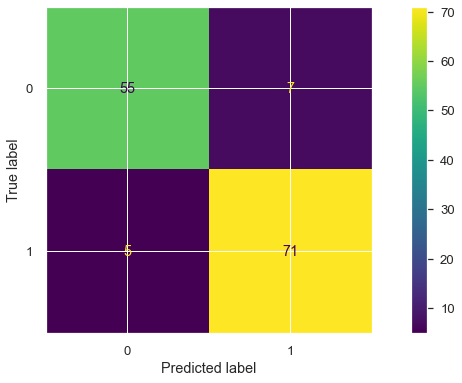

In [368]:
RF_model = RandomForestClassifier(class_weight="balanced", random_state=101)
RF_model.fit(X_train_scaled, y_train)
y_pred = RF_model.predict(X_test_scaled)
y_train_pred = RF_model.predict(X_train_scaled)

rf_f1 = f1_score(y_test, y_pred)
rf_acc = accuracy_score(y_test, y_pred)
rf_recall = recall_score(y_test, y_pred)
rf_auc = roc_auc_score(y_test, y_pred)


print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(RF_model, X_test_scaled, y_test)



# <font color="white" size=+0.5><b>6.4.b Cross-Validating Random Forest (RF)</b></font>


In [369]:
rf_xvalid_model = RandomForestClassifier(max_depth=None, random_state=101)

rf_xvalid_model_scores = cross_validate(rf_xvalid_model, X_train_scaled, y_train, scoring = ["accuracy", "precision", "recall", "f1"], cv = 10)
rf_xvalid_model_scores = pd.DataFrame(rf_xvalid_model_scores, index = range(1, 11))

rf_xvalid_model_scores

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1
1,0.170,0.012,0.808,0.804,0.860,0.831
2,0.160,0.013,0.846,0.830,0.907,0.867
3,0.164,0.013,0.885,0.886,0.907,0.897
4,0.162,0.013,0.846,0.878,0.837,0.857
5,0.162,0.012,0.859,0.848,0.907,0.876
6,0.169,0.013,0.808,0.804,0.860,0.831
7,0.170,0.015,0.821,0.796,0.907,0.848
8,0.238,0.013,0.795,0.814,0.814,0.814
9,0.175,0.013,0.821,0.875,0.795,0.833
10,0.179,0.014,0.897,0.891,0.932,0.911


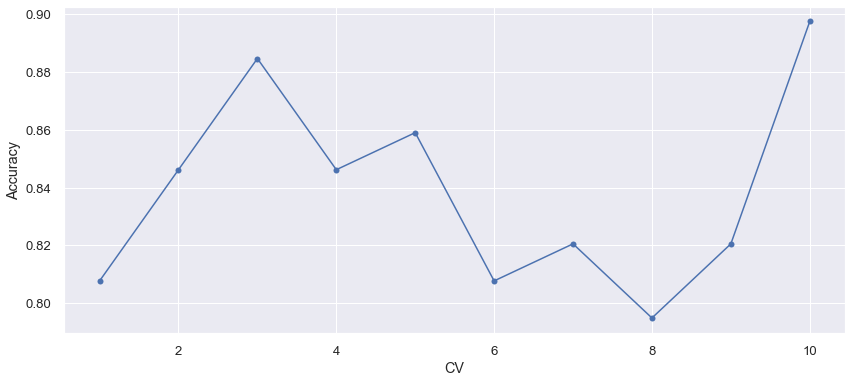

In [370]:
plot_cv(rf_xvalid_model_scores)

# <font color="white" size=+0.5><b>6.4.c Hyperparameter tuning Random Forest (RF) Using GridSeachCV</b></font>


In [371]:
param_grid = {'n_estimators':[50, 100, 300],
             'max_features':[2, 3, 4],
             'max_depth':[3, 5, 7, 9],
             'min_samples_split':[2, 5, 8]}

In [372]:
RF_grid_model = RandomForestClassifier(random_state=101)

RF_grid_model = GridSearchCV(estimator=RF_grid_model, 
                             param_grid=param_grid, 
                             scoring = "recall", 
                             n_jobs = -1, verbose = 2).fit(X_train_scaled, y_train)  # Whatch out, fit() can also be used here

Fitting 5 folds for each of 108 candidates, totalling 540 fits


In [373]:
print('Best Parameters of GridSearchCV for Random Forest Model:',RF_grid_model.best_params_)
print("--------------------------------------------------------------------------------------------------------------------")
print('Best Estimator of GridSearchCV for Random Forest Model:',RF_grid_model.best_estimator_)

Best Parameters of GridSearchCV for Random Forest Model: {'max_depth': 9, 'max_features': 2, 'min_samples_split': 5, 'n_estimators': 50}
--------------------------------------------------------------------------------------------------------------------
Best Estimator of GridSearchCV for Random Forest Model: RandomForestClassifier(max_depth=9, max_features=2, min_samples_split=5,
                       n_estimators=50, random_state=101)


--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.89      0.90        62
           1       0.91      0.93      0.92        76

    accuracy                           0.91       138
   macro avg       0.91      0.91      0.91       138
weighted avg       0.91      0.91      0.91       138

--------------------------------------------------------


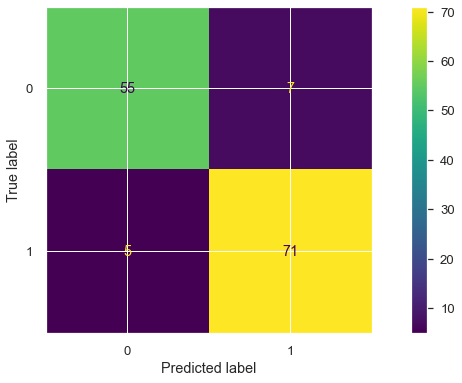

In [374]:
y_pred = RF_grid_model.predict(X_test_scaled)
y_train_pred = RF_grid_model.predict(X_train_scaled)

rf_grid_f1 = f1_score(y_test, y_pred)
rf_grid_acc = accuracy_score(y_test, y_pred)
rf_grid_recall = recall_score(y_test, y_pred)
rf_grid_auc = roc_auc_score(y_test, y_pred)


print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(RF_grid_model, X_test_scaled, y_test)



# <font color="white" size=+0.5><b>6.4.d Feature Importance for Random Forest (RF) Model</b></font>


In [375]:
RF_model.feature_importances_

array([0.10898111, 0.09119474, 0.13354602, 0.12568883, 0.03665641,
       0.04128405, 0.03123319, 0.01351116, 0.03067948, 0.02061457,
       0.0121477 , 0.08213791, 0.10715728, 0.16516756])

In [376]:
RF_feature_imp = pd.DataFrame(index = X.columns, data = RF_model.feature_importances_,
                              columns = ["Feature Importance"]).sort_values("Feature Importance", ascending = False)
RF_feature_imp

,Feature Importance
ST_Slope_Up,0.165
MaxHR,0.134
Oldpeak,0.126
Age,0.109
ST_Slope_Flat,0.107
RestingBP,0.091
ExerciseAngina_Y,0.082
ChestPainType_ATA,0.041
Sex_M,0.037
ChestPainType_NAP,0.031


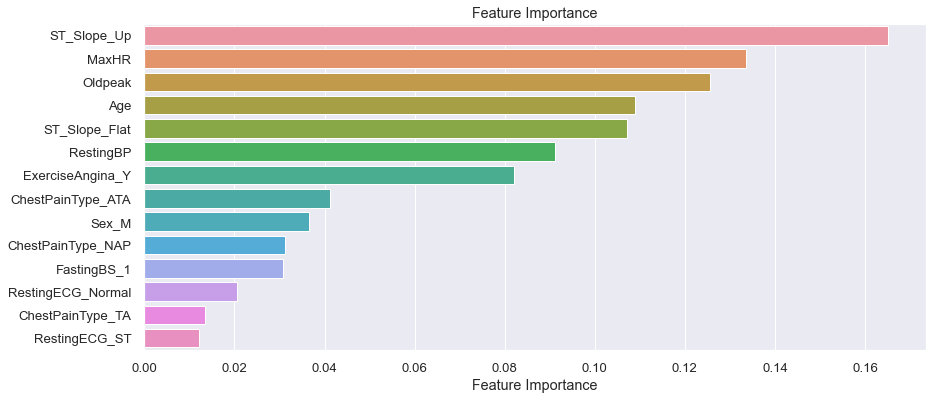

In [377]:
sns.barplot(x=RF_feature_imp["Feature Importance"], y=RF_feature_imp.index)
plt.title("Feature Importance")
plt.show()

# <font color="white" size=+0.5><b>6.4.e ROC (Receiver Operating Curve) and AUC (Area Under Curve)</b></font>


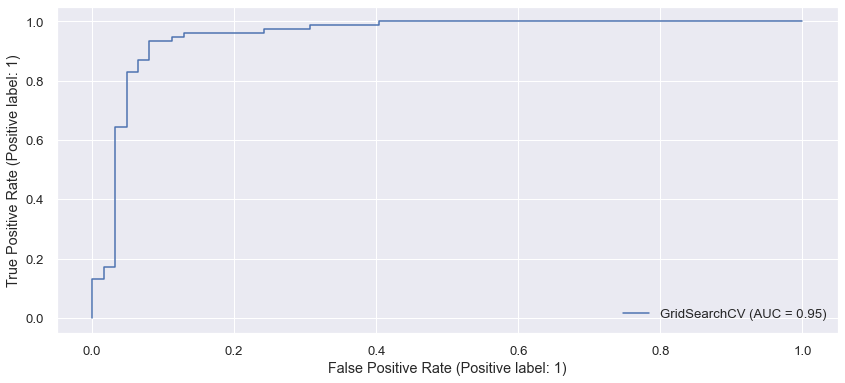

In [378]:
plot_roc_curve(RF_grid_model, X_test_scaled, y_test)

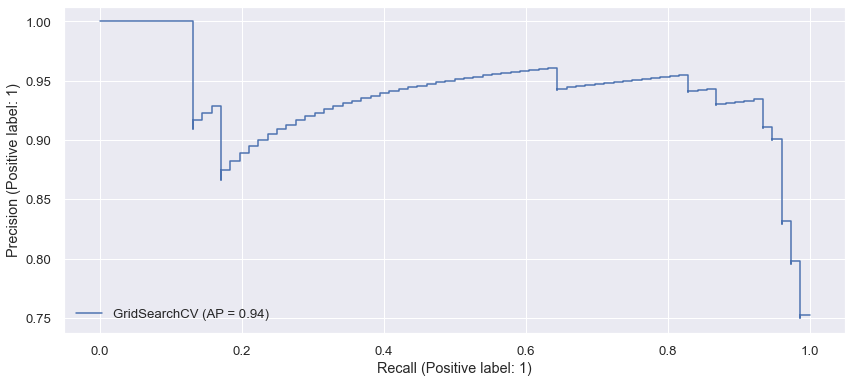

In [379]:
plot_precision_recall_curve(RF_grid_model, X_test_scaled, y_test)

# <font color="white" size=+0.5><b>6.4.f Visualization of the Tree</b></font>


In [380]:
features = list(X.columns)
targets = str(y.unique())

fig, axes = plt.subplots(nrows = 1,ncols = 1, figsize = (20,10), dpi=1500)
plot_tree(RF_model.estimators_[0],
          feature_names = features,
          class_names=targets,
          filled = True)

[Text(0.5694883966244726, 0.9666666666666667, 'Age <= 0.541\ngini = 0.5\nsamples = 488\nvalue = [386.638, 392.708]\nclass = 0'),
 Text(0.3500791139240506, 0.9, 'ChestPainType_ATA <= 0.5\ngini = 0.444\nsamples = 247\nvalue = [263.362, 130.903]\nclass = ['),
 Text(0.2782172995780591, 0.8333333333333334, 'RestingBP <= 0.78\ngini = 0.499\nsamples = 176\nvalue = [143.448, 129.097]\nclass = ['),
 Text(0.2020042194092827, 0.7666666666666667, 'ChestPainType_NAP <= 0.5\ngini = 0.495\nsamples = 162\nvalue = [141.207, 115.556]\nclass = ['),
 Text(0.11286919831223628, 0.7, 'ST_Slope_Flat <= 0.5\ngini = 0.451\nsamples = 105\nvalue = [53.793, 102.917]\nclass = 0'),
 Text(0.04430379746835443, 0.6333333333333333, 'ST_Slope_Up <= 0.5\ngini = 0.422\nsamples = 41\nvalue = [43.707, 18.958]\nclass = ['),
 Text(0.016877637130801686, 0.5666666666666667, 'Age <= 0.408\ngini = 0.361\nsamples = 3\nvalue = [1.121, 3.611]\nclass = 0'),
 Text(0.008438818565400843, 0.5, 'gini = 0.0\nsamples = 2\nvalue = [0.0, 3.611

# <font color="white" size=+1.5><b>6.5 K-Nearest Neighbor (KNN)</b></font>


In [381]:
accuracy_scores

,LR_Acc,SVC_Acc,DT_Acc,RF_Acc,KNN_Acc,MLP_Acc,XGB_Acc
Basic,0.863,0.695,1.000,0.988,0.826,0.873,1.000
Scaled,0.864,0.879,1.000,0.988,0.900,0.885,1.000
Balanced,0.855,0.699,1.000,0.988,0.826,0.864,1.000
Scaled_Balanced,0.856,0.882,1.000,0.988,0.900,0.879,1.000


# <font color="white" size=+0.5><b>6.5.a Modelling K-Nearest Neighbor (KNN) with Default Parameters</b></font>


--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.84      0.85        62
           1       0.87      0.89      0.88        76

    accuracy                           0.87       138
   macro avg       0.87      0.87      0.87       138
weighted avg       0.87      0.87      0.87       138

--------------------------------------------------------


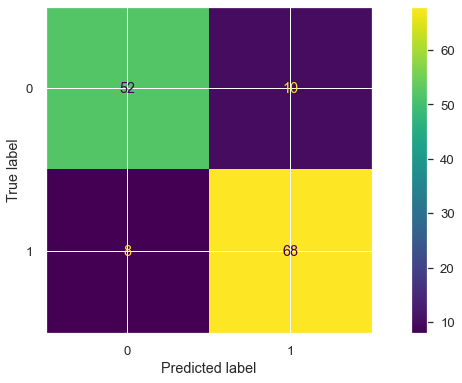

In [382]:
KNN_model = KNeighborsClassifier(n_neighbors=5, algorithm="kd_tree")
KNN_model.fit(X_train_scaled, y_train)
y_pred = KNN_model.predict(X_test_scaled)
y_train_pred = KNN_model.predict(X_train_scaled)

knn_f1 = f1_score(y_test, y_pred)
knn_acc = accuracy_score(y_test, y_pred)
knn_recall = recall_score(y_test, y_pred)
knn_auc = roc_auc_score(y_test, y_pred)


print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(KNN_model, X_test_scaled, y_test)



In [383]:
y_pred_proba = KNN_model.predict_proba(X_test_scaled)

In [384]:
pd.DataFrame(y_pred_proba)

,0,1
0,0.000,1.000
1,0.000,1.000
2,0.000,1.000
3,0.800,0.200
4,0.400,0.600
...,...,...
133,0.800,0.200
134,1.000,0.000
135,0.600,0.400
136,0.000,1.000


In [385]:
my_dict = {"Actual": y_test, "Pred": y_pred, "Proba_1": y_pred_proba[:,1], "Proba_0":y_pred_proba[:,0]}

In [386]:
pd.DataFrame.from_dict(my_dict).sample(10)

,Actual,Pred,Proba_1,Proba_0
719,1,1,1.000,0.000
881,0,0,0.000,1.000
350,1,1,1.000,0.000
828,1,1,1.000,0.000
652,1,0,0.000,1.000
17,0,0,0.000,1.000
251,1,1,0.800,0.200
402,1,1,1.000,0.000
135,1,1,0.800,0.200
57,1,1,0.600,0.400


# <font color="white" size=+0.5><b>6.5.b Cross-Validating K-Nearest Neighbor (KNN)</b></font>



In [387]:
knn_xvalid_model = KNeighborsClassifier(n_neighbors=5)

knn_xvalid_model_scores = cross_validate(knn_xvalid_model, X_train_scaled, y_train, scoring = ["accuracy", "precision", "recall", "f1"], cv = 10)
knn_xvalid_model_scores = pd.DataFrame(knn_xvalid_model_scores, index = range(1, 11))

knn_xvalid_model_scores

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1
1,0.003,0.007,0.782,0.783,0.837,0.809
2,0.001,0.007,0.859,0.833,0.930,0.879
3,0.001,0.007,0.897,0.889,0.930,0.909
4,0.002,0.008,0.821,0.837,0.837,0.837
5,0.002,0.006,0.897,0.872,0.953,0.911
6,0.001,0.007,0.782,0.771,0.860,0.813
7,0.002,0.006,0.846,0.816,0.930,0.870
8,0.001,0.007,0.846,0.830,0.907,0.867
9,0.002,0.007,0.833,0.897,0.795,0.843
10,0.002,0.006,0.923,0.913,0.955,0.933


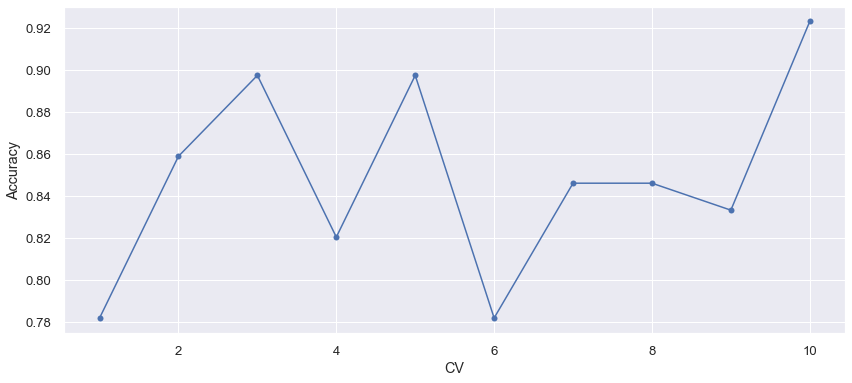

In [388]:
plot_cv(knn_xvalid_model_scores)

# <font color="white" size=+0.5><b>6.5.c Elbow Method for Choosing Reasonable K Values</b></font>


In [389]:
test_error_rates = []


for k in range(1, 30):
    KNN_model = KNeighborsClassifier(n_neighbors=k)
    KNN_model.fit(X_train_scaled, y_train) 
   
    y_test_pred = KNN_model.predict(X_test_scaled)
    
    test_error = 1 - accuracy_score(y_test, y_test_pred)
    test_error_rates.append(test_error)

In [390]:
test_error_rates

[0.19565217391304346,
 0.2028985507246377,
 0.1376811594202898,
 0.15217391304347827,
 0.13043478260869568,
 0.15217391304347827,
 0.12318840579710144,
 0.15217391304347827,
 0.12318840579710144,
 0.1376811594202898,
 0.1376811594202898,
 0.14492753623188404,
 0.14492753623188404,
 0.14492753623188404,
 0.15217391304347827,
 0.15217391304347827,
 0.1594202898550725,
 0.15217391304347827,
 0.15217391304347827,
 0.1376811594202898,
 0.1376811594202898,
 0.1376811594202898,
 0.1376811594202898,
 0.1376811594202898,
 0.1376811594202898,
 0.1376811594202898,
 0.1376811594202898,
 0.1376811594202898,
 0.1376811594202898]

Text(0, 0.5, 'Error Rate')

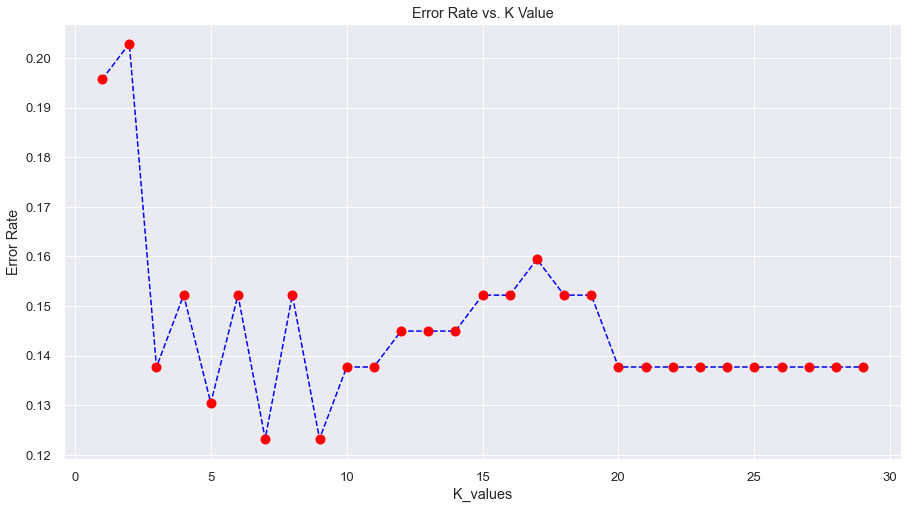

In [391]:
plt.figure(figsize=(15, 8))
plt.plot(range(1, 30), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')

# <font color="white" size=+0.5><b>6.5.d GridsearchCV for Choosing Reasonable K Values</b></font>



In [392]:
k_values= range(1, 30)
param_grid = {"n_neighbors": k_values, "p": [1, 2], "weights": ['uniform', "distance"]}

In [393]:
KNN_grid = KNeighborsClassifier()

In [394]:
KNN_grid_model = GridSearchCV(KNN_grid, param_grid, cv=10, scoring='accuracy')

In [395]:
KNN_grid_model.fit(X_train_scaled, y_train)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(1, 30), 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [396]:
print('Best Parameters of GridSearchCV for KNN Model:',KNN_grid_model.best_params_)
print("--------------------------------------------------------------------------------------------------------------------")
print('Best Estimator of GridSearchCV for KNN Model: ', KNN_grid_model.best_estimator_)

Best Parameters of GridSearchCV for KNN Model: {'n_neighbors': 8, 'p': 1, 'weights': 'uniform'}
--------------------------------------------------------------------------------------------------------------------
Best Estimator of GridSearchCV for KNN Model:  KNeighborsClassifier(n_neighbors=8, p=1)


WITH K=8
--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.84      0.85        62
           1       0.87      0.89      0.88        76

    accuracy                           0.87       138
   macro avg       0.87      0.87      0.87       138
weighted avg       0.87      0.87      0.87       138

--------------------------------------------------------


,train_set,test_set
Accuracy,0.879,0.870
Precision,0.881,0.872
Recall,0.905,0.895
f1,0.893,0.883


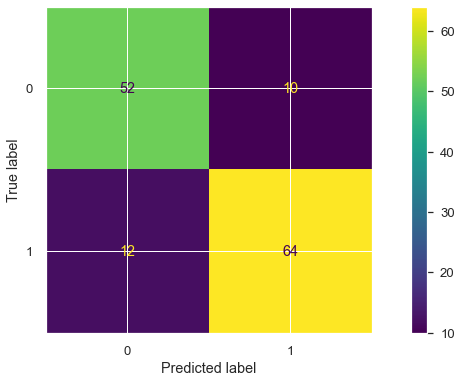

In [397]:
# NOW WITH K=8

KNN_model = KNeighborsClassifier(n_neighbors=8, p=1, weights='uniform')
KNN_model.fit(X_train_scaled, y_train)
pred = KNN_model.predict(X_test_scaled)
y_train_pred = KNN_model.predict(X_train_scaled)

knn26_f1 = f1_score(y_test, y_pred)
knn26_acc = accuracy_score(y_test, y_pred)
knn26_recall = recall_score(y_test, y_pred)
knn26_auc = roc_auc_score(y_test, y_pred)

print('WITH K=8')
print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(KNN_model, X_test_scaled, y_test)

train_val(y_train, y_train_pred, y_test, y_pred)

WITH K=18
-------------------
[[52 10]
 [ 8 68]]
--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.87      0.84      0.85        62
           1       0.87      0.89      0.88        76

    accuracy                           0.87       138
   macro avg       0.87      0.87      0.87       138
weighted avg       0.87      0.87      0.87       138

--------------------------------------------------------


,train_set,test_set
Accuracy,0.864,0.870
Precision,0.864,0.872
Recall,0.896,0.895
f1,0.880,0.883


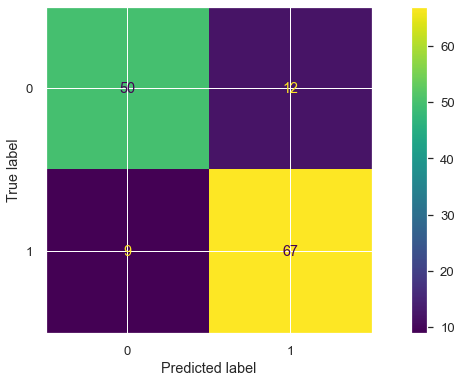

In [398]:
# NOW WITH K=18

KNN_model = KNeighborsClassifier(n_neighbors=18, p=1,weights='uniform')
KNN_model.fit(X_train_scaled, y_train)
pred = KNN_model.predict(X_test_scaled)
y_train_pred = KNN_model.predict(X_train_scaled)

knn18_f1 = f1_score(y_test, y_pred)
knn18_acc = accuracy_score(y_test, y_pred)
knn18_recall = recall_score(y_test, y_pred)
knn18_auc = roc_auc_score(y_test, y_pred)

print('WITH K=18')
print('-------------------')
print(confusion_matrix(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(KNN_model, X_test_scaled, y_test)

train_val(y_train, y_train_pred, y_test, y_pred)

# <font color="white" size=+0.5><b>6.5.e ROC (Receiver Operating Curve) and AUC (Area Under Curve)</b></font>


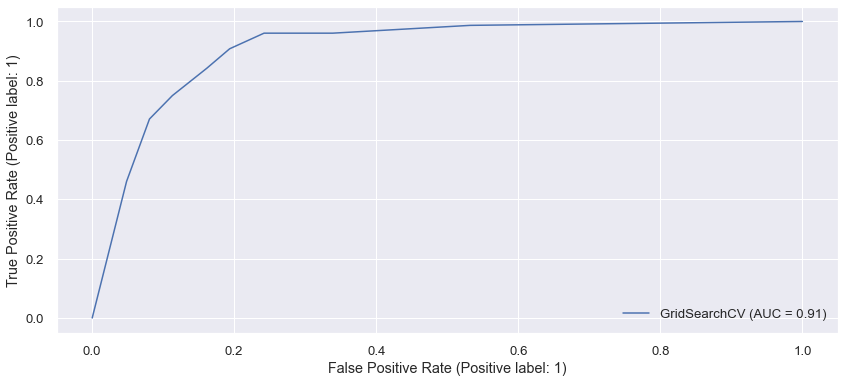

In [399]:
plot_roc_curve(KNN_grid_model, X_test_scaled, y_test)

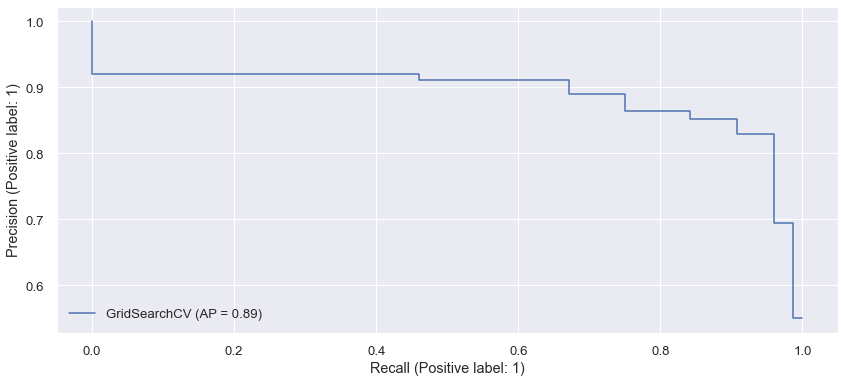

In [400]:
plot_precision_recall_curve(KNN_grid_model, X_test_scaled, y_test)

In [401]:
accuracy_scores

,LR_Acc,SVC_Acc,DT_Acc,RF_Acc,KNN_Acc,MLP_Acc,XGB_Acc
Basic,0.863,0.695,1.000,0.988,0.826,0.873,1.000
Scaled,0.864,0.879,1.000,0.988,0.900,0.885,1.000
Balanced,0.855,0.699,1.000,0.988,0.826,0.864,1.000
Scaled_Balanced,0.856,0.882,1.000,0.988,0.900,0.879,1.000


# <font color="white" size=+1.5><b>6.7 MLP</b></font>


In [402]:
accuracy_scores

,LR_Acc,SVC_Acc,DT_Acc,RF_Acc,KNN_Acc,MLP_Acc,XGB_Acc
Basic,0.863,0.695,1.000,0.988,0.826,0.873,1.000
Scaled,0.864,0.879,1.000,0.988,0.900,0.885,1.000
Balanced,0.855,0.699,1.000,0.988,0.826,0.864,1.000
Scaled_Balanced,0.856,0.882,1.000,0.988,0.900,0.879,1.000


# <font color="white" size=+0.5><b>6.7.a Modelling MLPClassifier with Default Parameters & Model Performance</b></font>


--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.82      0.86        62
           1       0.86      0.92      0.89        76

    accuracy                           0.88       138
   macro avg       0.88      0.87      0.87       138
weighted avg       0.88      0.88      0.88       138

--------------------------------------------------------


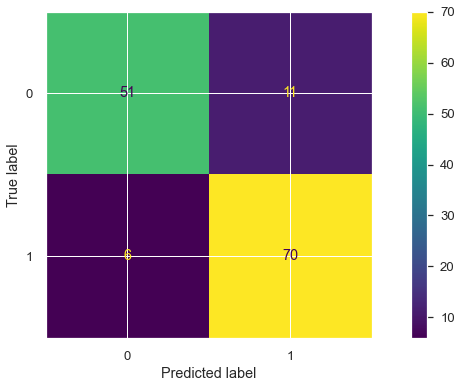

In [403]:
mlp_clf = MLPClassifier(hidden_layer_sizes=200,max_iter=300)
mlp_clf.fit(X_train, y_train)
y_pred = mlp_clf.predict(X_test)
y_train_pred = mlp_clf.predict(X_train)

ab_f1 = f1_score(y_test, y_pred)
ab_acc = accuracy_score(y_test, y_pred)
ab_recall = recall_score(y_test, y_pred)
ab_auc = roc_auc_score(y_test, y_pred)


print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(mlp_clf, X_test, y_test)



In [404]:
train_val(y_train, y_train_pred, y_test, y_pred)

,train_set,test_set
Accuracy,0.873,0.877
Precision,0.872,0.864
Recall,0.903,0.921
f1,0.887,0.892


# <font color="white" size=+0.5><b>6.7.b Cross-Validating MLP</b></font>


In [405]:
ab_xvalid_model = MLPClassifier(hidden_layer_sizes=200,max_iter=300)

ab_xvalid_model_scores = cross_validate(ab_xvalid_model, X_train, y_train, scoring = ['accuracy', 'precision','recall', 'f1'], cv = 10)
ab_xvalid_model_scores = pd.DataFrame(ab_xvalid_model_scores, index = range(1, 11))

ab_xvalid_model_scores

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1
1,0.622,0.004,0.756,0.800,0.744,0.771
2,0.359,0.005,0.795,0.865,0.744,0.800
3,0.675,0.006,0.872,0.884,0.884,0.884
4,0.645,0.006,0.808,0.818,0.837,0.828
5,0.640,0.005,0.897,0.907,0.907,0.907
6,0.433,0.004,0.846,0.830,0.907,0.867
7,0.397,0.005,0.885,0.840,0.977,0.903
8,0.539,0.005,0.833,0.875,0.814,0.843
9,0.671,0.005,0.833,0.919,0.773,0.840
10,0.544,0.004,0.923,0.913,0.955,0.933


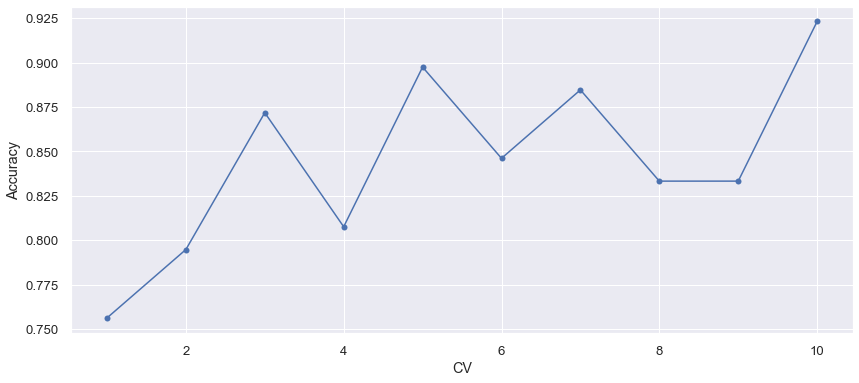

In [406]:
plot_cv(ab_xvalid_model_scores)

# <font color="white" size=+0.5><b>6.7.c Hyperparameter tuning MLP classifier using GridsearchCV </b></font>

In [407]:
parameter_space = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam','lbfgs'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
}
clf = GridSearchCV(mlp_clf, parameter_space, n_jobs=-1, cv=10)
clf.fit(X_train, y_train)

GridSearchCV(cv=10,
             estimator=MLPClassifier(hidden_layer_sizes=200, max_iter=300),
             n_jobs=-1,
             param_grid={'activation': ['tanh', 'relu'],
                         'alpha': [0.0001, 0.05],
                         'hidden_layer_sizes': [(50, 50, 50), (50, 100, 50),
                                                (100,)],
                         'learning_rate': ['constant', 'adaptive'],
                         'solver': ['sgd', 'adam', 'lbfgs']})

In [408]:
print('Best parameters found:\n', clf.best_params_)

Best parameters found:
 {'activation': 'relu', 'alpha': 0.05, 'hidden_layer_sizes': (50, 100, 50), 'learning_rate': 'constant', 'solver': 'lbfgs'}


WITH K=8
--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.82      0.86        62
           1       0.86      0.92      0.89        76

    accuracy                           0.88       138
   macro avg       0.88      0.87      0.87       138
weighted avg       0.88      0.88      0.88       138

--------------------------------------------------------


,train_set,test_set
Accuracy,0.838,0.877
Precision,0.800,0.864
Recall,0.944,0.921
f1,0.866,0.892


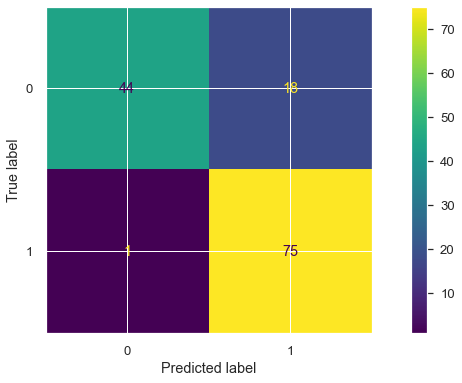

In [409]:
# NOW WITH K=8
pred = clf.predict(X_test_scaled)
y_train_pred = clf.predict(X_train_scaled)

mlp_final_f1 = f1_score(y_test, y_pred)
mlp_final_acc = accuracy_score(y_test, y_pred)
mlp_final_recall = recall_score(y_test, y_pred)
mlp_final_auc = roc_auc_score(y_test, y_pred)

print('WITH K=8')
print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(clf, X_test_scaled, y_test)

train_val(y_train, y_train_pred, y_test, y_pred)

# <font color="white" size=+1.5><b>6.8 XGBoost Classifier (XGB)</b></font>


**First let's take a close look at the models' accuracy scores for comparing the results given by Scaled, Not Scaled, Balanced and Not Balanced models.**

In [410]:
accuracy_scores

,LR_Acc,SVC_Acc,DT_Acc,RF_Acc,KNN_Acc,MLP_Acc,XGB_Acc
Basic,0.863,0.695,1.000,0.988,0.826,0.873,1.000
Scaled,0.864,0.879,1.000,0.988,0.900,0.885,1.000
Balanced,0.855,0.699,1.000,0.988,0.826,0.864,1.000
Scaled_Balanced,0.856,0.882,1.000,0.988,0.900,0.879,1.000


# <font color="white" size=+0.5><b>6.8.a Modelling XGBoost (XGB) with Default Parameters & Model Performance</b></font>


--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.89      0.89        62
           1       0.91      0.91      0.91        76

    accuracy                           0.90       138
   macro avg       0.90      0.90      0.90       138
weighted avg       0.90      0.90      0.90       138

--------------------------------------------------------


,train_set,test_set
Accuracy,1.000,0.899
Precision,1.000,0.908
Recall,1.000,0.908
f1,1.000,0.908


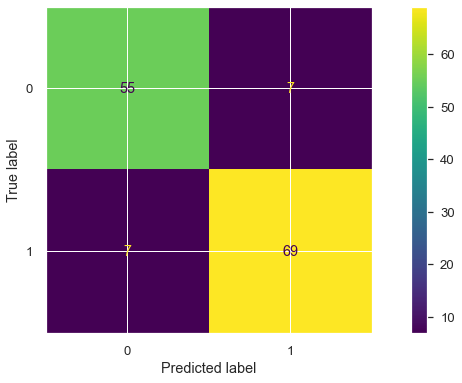

In [411]:
XGB_model = XGBClassifier(random_state=101)
XGB_model.fit(X_train_scaled, y_train)
y_pred = XGB_model.predict(X_test_scaled)
y_train_pred = XGB_model.predict(X_train_scaled)

xgb_f1 = f1_score(y_test, y_pred)
xgb_acc = accuracy_score(y_test, y_pred)
xgb_recall = recall_score(y_test, y_pred)
xgb_auc = roc_auc_score(y_test, y_pred)

print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(XGB_model, X_test_scaled, y_test)

train_val(y_train, y_train_pred, y_test, y_pred)

# <font color="white" size=+0.5><b>6.8.b Cross-Validating XGBoost(XGB)</b></font>


In [412]:
xgb_xvalid_model = XGBClassifier(random_state=101)

xgb_xvalid_model_scores = cross_validate(xgb_xvalid_model, X_train_scaled, y_train, scoring = ["accuracy", "precision", "recall", "f1"], cv = 10)
xgb_xvalid_model_scores = pd.DataFrame(xgb_xvalid_model_scores, index = range(1, 11))

xgb_xvalid_model_scores

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1
1,0.081,0.007,0.808,0.804,0.860,0.831
2,0.087,0.008,0.833,0.841,0.860,0.851
3,0.081,0.008,0.910,0.909,0.930,0.920
4,0.085,0.007,0.885,0.886,0.907,0.897
5,0.075,0.006,0.846,0.844,0.884,0.864
6,0.072,0.006,0.808,0.792,0.884,0.835
7,0.070,0.006,0.833,0.812,0.907,0.857
8,0.070,0.006,0.808,0.818,0.837,0.828
9,0.073,0.006,0.846,0.921,0.795,0.854
10,0.080,0.006,0.885,0.907,0.886,0.897


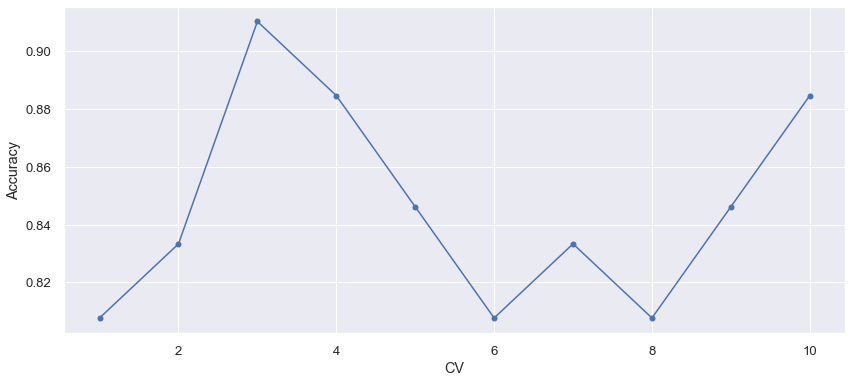

In [413]:
plot_cv(xgb_xvalid_model_scores)

# <font color="white" size=+0.5><b>6.8.c Feature Importance for XGBoost (XGB) Model</b></font>


In [414]:
XGB_model.feature_importances_ 

array([0.0135837 , 0.01292679, 0.01592918, 0.02302292, 0.04141824,
       0.03152815, 0.03382011, 0.01725588, 0.02550761, 0.01576003,
       0.01301161, 0.03479907, 0.01901271, 0.70242405], dtype=float32)

In [415]:
feats = pd.DataFrame(index=X.columns, data=XGB_model.feature_importances_, columns=["Feature Importance"])
XGB_feature_imp = feats.sort_values("Feature Importance", ascending=False)

XGB_feature_imp 

,Feature Importance
ST_Slope_Up,0.702
Sex_M,0.041
ExerciseAngina_Y,0.035
ChestPainType_NAP,0.034
ChestPainType_ATA,0.032
FastingBS_1,0.026
Oldpeak,0.023
ST_Slope_Flat,0.019
ChestPainType_TA,0.017
MaxHR,0.016


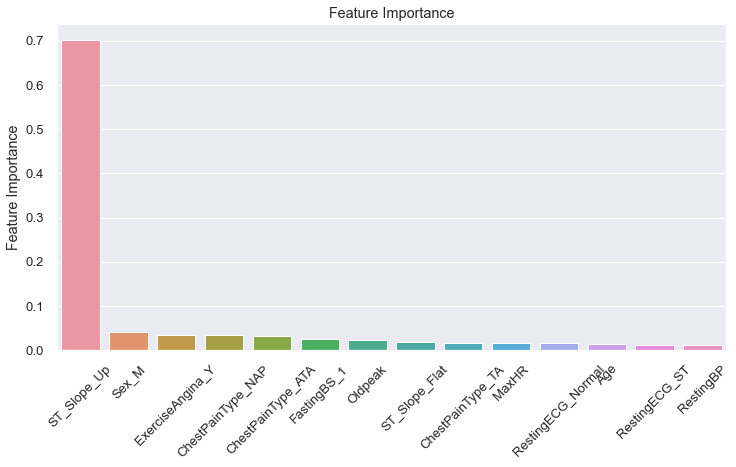

In [416]:
plt.figure(figsize=(12,6))
sns.barplot(y=XGB_feature_imp["Feature Importance"], x=XGB_feature_imp.index)

plt.title("Feature Importance")
plt.xticks(rotation=45)
plt.show()

# <font color="white" size=+0.5><b>6.8.d Hyperparameter tuning XGBoost (XGB) Using GridSearchCV</b></font>


In [417]:
param_grid = {"n_estimators":[100, 300], 
              "max_depth":[3,5,6], 
              "learning_rate": [0.1, 0.3],
              "subsample":[0.5, 1], 
              "colsample_bytree":[0.5, 1]}

In [418]:
XGB_grid_model = XGBClassifier(random_state=42)
XGB_grid_model = GridSearchCV(XGB_grid_model, param_grid, scoring = "f1", n_jobs = -1)

In [419]:
XGB_grid_model.fit(X_train_scaled, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_cat_to_...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     n

In [420]:
print('Best Parameters of GridSearchCV for RF Model: ', XGB_grid_model.best_params_)
print("--------------------------------------------------------------------------------------------------------------------")
print('Best Estimator of GridSearchCV for RF Model: ', XGB_grid_model.best_estimator_)

Best Parameters of GridSearchCV for RF Model:  {'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1}
--------------------------------------------------------------------------------------------------------------------
Best Estimator of GridSearchCV for RF Model:  XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.5,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=42,
              reg_alpha=0, reg_lambda=1, 

--------------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.92      0.92        62
           1       0.93      0.93      0.93        76

    accuracy                           0.93       138
   macro avg       0.93      0.93      0.93       138
weighted avg       0.93      0.93      0.93       138

--------------------------------------------------------


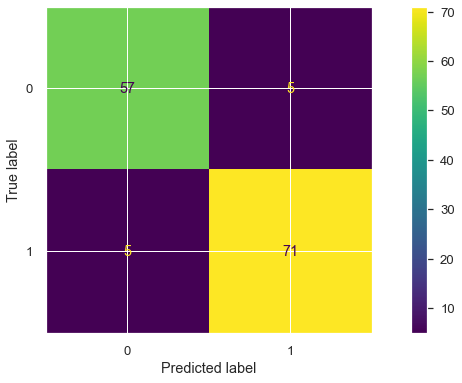

In [421]:
y_pred = XGB_grid_model.predict(X_test_scaled)
y_train_pred = XGB_grid_model.predict(X_train_scaled)

xgb_grid_f1 = f1_score(y_test, y_pred)
xgb_grid_acc = accuracy_score(y_test, y_pred)
xgb_grid_recall = recall_score(y_test, y_pred)
xgb_grid_auc = roc_auc_score(y_test, y_pred)

print("\033[1m--------------------------------------------------------\033[0m")
print(classification_report(y_test, y_pred))
print("\033[1m--------------------------------------------------------\033[0m")

plot_confusion_matrix(XGB_grid_model, X_test_scaled, y_test)


# <font color="white" size=+0.5><b>6.8.e ROC (Receiver Operating Curve) and AUC (Area Under Curve)</b></font>


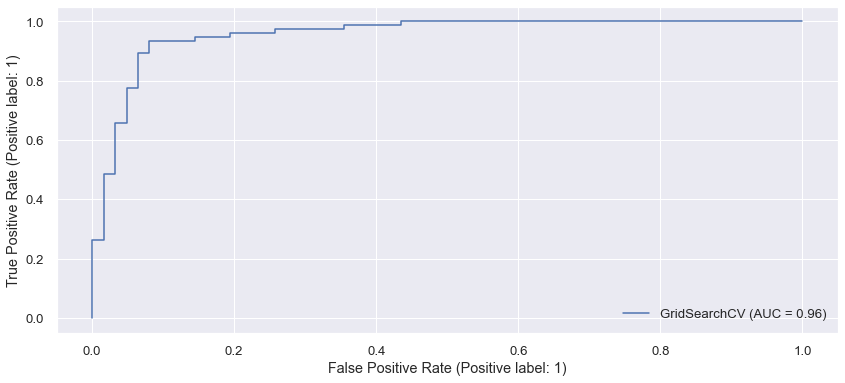

In [422]:
plot_roc_curve(XGB_grid_model, X_test_scaled, y_test);

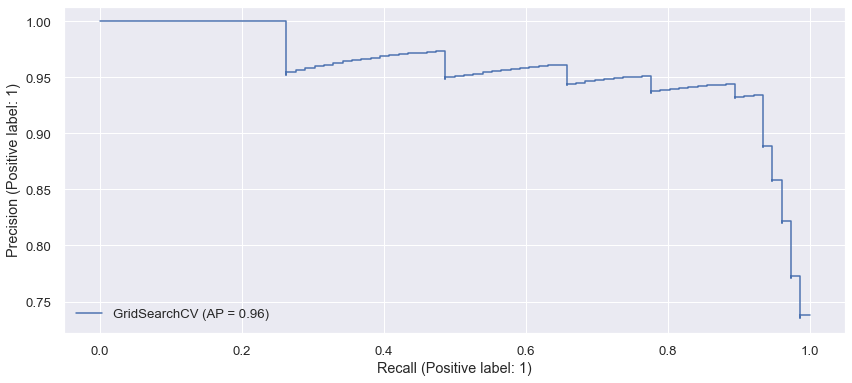

In [423]:
plot_precision_recall_curve(XGB_grid_model, X_test_scaled, y_test);

# <font color="white" size=+3.5><b>7) COMPARISON OF MODELS</b></font>


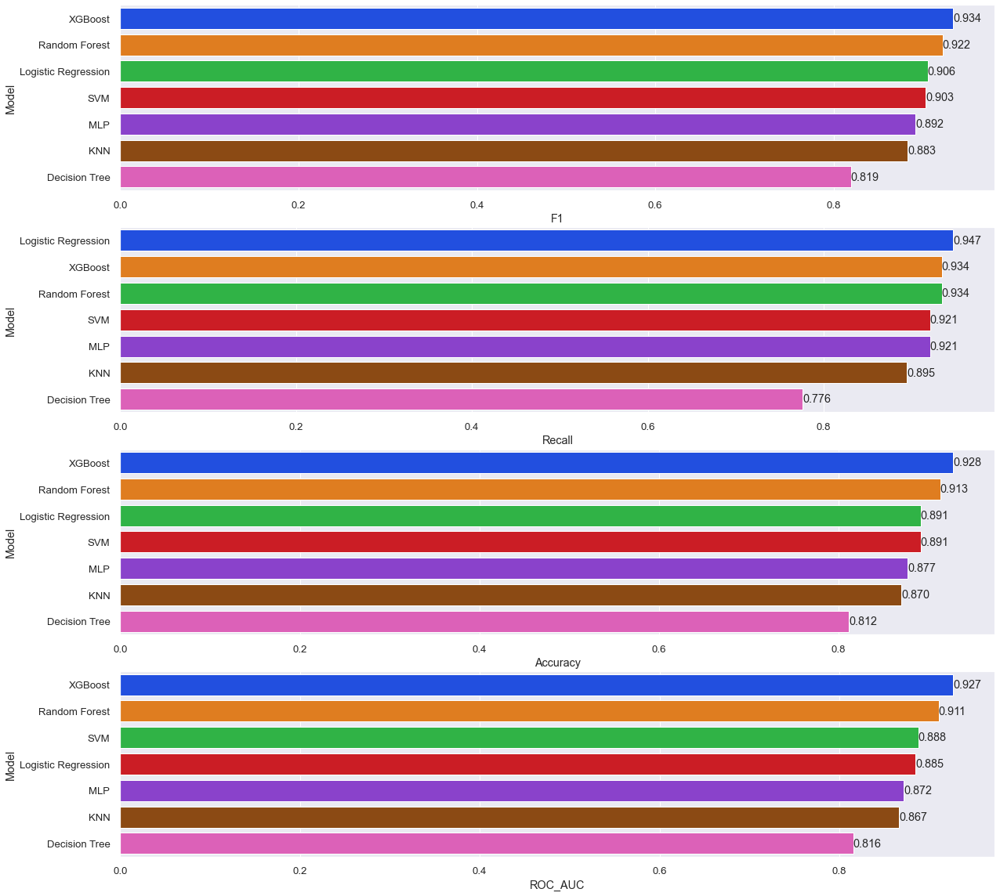

In [427]:
compare = pd.DataFrame({"Model": ["Logistic Regression", "SVM", "KNN", "Decision Tree", "Random Forest", "MLP", "XGBoost"],
                        "F1": [log_f1, svm_grid_f1, knn_f1, dt_grid_f1, rf_grid_f1, mlp_final_f1, xgb_grid_f1],
                        "Recall": [log_recall, svm_grid_recall, knn_recall, dt_grid_recall, rf_grid_recall, mlp_final_recall, xgb_grid_recall],
                        "Accuracy": [log_acc, svm_grid_acc, knn_acc, dt_grid_acc, rf_grid_acc, mlp_final_acc, xgb_grid_acc],
                        "ROC_AUC": [log_auc, svm_grid_auc, knn_auc, dt_grid_auc, rf_grid_auc, mlp_final_auc, xgb_grid_auc]})

def labels(ax):
    for p in ax.patches:
        width = p.get_width()                        # get bar length
        ax.text(width,                               # set the text at 1 unit right of the bar
                p.get_y() + p.get_height() / 2,      # get Y coordinate + X coordinate / 2
                '{:1.3f}'.format(width),             # set variable to display, 2 decimals
                ha = 'left',                         # horizontal alignment
                va = 'center')                       # vertical alignment
    
plt.figure(figsize=(20,20))
plt.subplot(411)
compare = compare.sort_values(by="F1", ascending=False)
ax=sns.barplot(x="F1", y="Model", data=compare, palette="bright")
labels(ax)

plt.subplot(412)
compare = compare.sort_values(by="Recall", ascending=False)
ax=sns.barplot(x="Recall", y="Model", data=compare, palette="bright")
labels(ax)

plt.subplot(413)
compare = compare.sort_values(by="Accuracy", ascending=False)
ax=sns.barplot(x="Accuracy", y="Model", data=compare, palette="bright")
labels(ax)

plt.subplot(414)
compare = compare.sort_values(by="ROC_AUC", ascending=False)
ax=sns.barplot(x="ROC_AUC", y="Model", data=compare, palette="bright")
labels(ax)

plt.show()

# <font color="white" size=+3.5><b>8) Pipeline implementation</b></font>


In [425]:
import pickle
pickle.dump(XGB_grid_model, open('model.pkl','wb'))

# Loading model to compare the results
model = pickle.load(open('model.pkl','rb'))

In [464]:
class Pipeline():
    def __init__(self, train, test, target):
        print("Initializing Pipeline...", end=" ")
        # self.model = model.lower()
        self.train = train
        self.test = test
        self.target = target
        self.scaler = MinMaxScaler()
        self.MODEL = None   # This will be the model object
        print("✔")
    # def __set_inputs(self):
    #     print("Setting up the Pipeline...", end = " ")
    #     self.scaler = MinMaxScaler()
    #     print("✔")
    def __preprocessing(self):
        print("Preprocessing Data...", end = " ")
        # Converting dataset to correct format
        self.train.dropna(inplace = True)
        # self.train.reset_index(inplace = True)
        self.train=pd.get_dummies(self.train,drop_first=True)
        self.train=self.scaler.fit_transform(self.train)
        self.features = [i for i in self.train.columns if i != self.target]
        self.test.dropna(inplace = True)
        # self.test.reset_index(inplace = True)
        self.train=pd.get_dummies(self.train,drop_first=True)
        self.test=self.scaler.transform(self.test)
        print("✔")

    def __set_params(self):
            self.MODEL = XGB_grid_model
    def __train_model(self):
        print("Training Model...", end = " ")
        self.MODEL.fit(self.train[self.features], self.train[self.target])
        print("✔")
    
    def evaluate(self):
        try:
            # self.__set_inputs()
            self.__preprocessing()
            self.__set_params()
            self.__train_model()
            print("Evaluating Model...", end = "")
            pred = self.MODEL.predict(self.test[self.features])
            # Obtaining the metrics
            acc = accuracy_score(self.test[self.target], pred)
            cr = classification_report(self.test[self.target], pred, target_names=self.LE.classes_)
            print("✔")
            # Printing the metrics
            print("Results:\n\nAccuracy on Test Dataset:", str(np.around(acc, decimals=4)*100)+"%")
            print("Classification Report:\n", cr)
        except:
            print("Error!\n\nInvalid Parameters")   # Error handling

In [465]:
hi=Pipeline(X_train,X_test,'HeartDisease')
hi.evaluate()

Initializing Pipeline... ✔
Preprocessing Data... Error!

Invalid Parameters


# <font color="white" size=+3.5><b>9) CONCLUSION</b></font>



- In this study respectively,

- We have tried to a predict classification problem in Heart Disease Dataset by a variety of models to classifiy Heart Disease predictions in the contex of determining whether anybody is likely to get hearth disease based on the input parameters like gender, age and various test results or not.

- We have made the detailed exploratory analysis (EDA).

- There have been NO missing values in the Dataset.

- We have decided which metrics will be used.

- We have analyzed both target and features in detail.

- We have transformed categorical variables into dummies so we can use them in the models.

- We have handled with skewness problem for make them closer to normal distribution; however, having examined the results, it's clear to assume that handling with skewness could NOT make any contribution to our models when comparing the results obtained by LogisticClassifier without using PowerTransform. Therefore, in this study we have continue not handling with skewness assuming that it's useless for the results.

- We have cross-checked the models obtained from train sets by applying cross validation for each model performance.

- We have examined the feature importance of some models.

- Lastly we have examined the results of all models visually with respect to select the best one for the problem in hand.

- Any contribution will be appriciated.

- By the way, if you enjoy reading this analysis, you can show it by supporting 👍